In [24]:
import shelve
import io
#import gdbm
#mod = __import__('gdbm')
import dumbdbm
import pandas as pd
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn import datasets, decomposition
import numpy as np
import gc
from datetime import datetime
import datetime as dt
#datetime.strptime('2016-03-29','%Y-%d-%m')
import dateparser
from ipykernel import kernelapp as app
import csv
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from operator import itemgetter
import folium
from folium.plugins import HeatMap
import Instalib as IL
import Instaplot as IP
import math
import re
import string
import emoji
import pickle
import scipy.io
from sklearn.feature_extraction.text import CountVectorizer
import nltk.stem
import sktensor
import geopy.distance
from itertools import groupby
import ncp
from datetime import timedelta
from dateutil.relativedelta import *
import os
from nltk.corpus import stopwords
from nltk.stem.snowball import FrenchStemmer
import nltk.data #
nltk.download('punkt')
from nltk.stem.snowball import FrenchStemmer
italian_stemmer = nltk.stem.SnowballStemmer('italian')
english_stemmer = nltk.stem.SnowballStemmer('english')
from langdetect import detect
from langdetect.lang_detect_exception import LangDetectException
import langid
langid.set_languages(['it', 'en'])  # ISO 639-1 codes
import time
import datetime
import geopandas
import sys
sys.path.append("/usr/local/lib/python2.7/dist-packages/matlab")
#sys.path.append("/opt/anaconda/miniconda3/lib/python3.6/site-packages/matlab")
import matlab
from matlab import engine

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Open the file and have a first look

Read the data and concatenate in a single DataFrame file, basic file format for pandas. It's a 2-D object, tabular file with labeled rows and columns, built from a dictionary or such. 

More info about it here: https://pandas.pydata.org/pandas-docs/stable/10min.html

Make our life easier by matching the Torino labels with the Marseille ones and convert strings to datetime

In [6]:
df_new=pd.read_csv('Torino_data/torino_posts.csv',lineterminator='\n')
df_new=df_new.rename(columns = {'caption':'text','taken_at_timestamp':'date'})
df_new.head()

,date,text,location_id
0,2017-11-14 16:20:42,After great week to home of my Friend this sac...,135250610358325
1,2017-10-31 16:10:00,Fisrt Flower of my new style.. thanx Teresa.. ...,135250610358325
2,2017-10-16 15:22:37,This for new roses!! Thanx Simone!!#walterbian...,135250610358325
3,2017-10-05 15:40:03,New skull !! #walterbianco_wb #wbtattooartgall...,135250610358325
4,2017-10-03 16:13:43,Paint acrilic biomech on sale 40cm X 30 cm o...,135250610358325


In [7]:
list_dates, Histo = IL.N_posts(df_new, debug=False)
Npostslog=[np.log10(H) for H in Histo]
Nposts=[H for H in Histo]

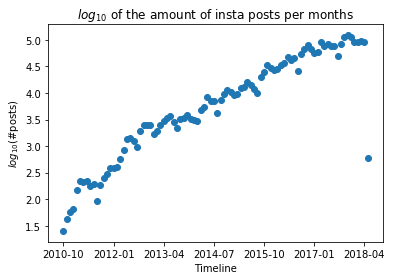

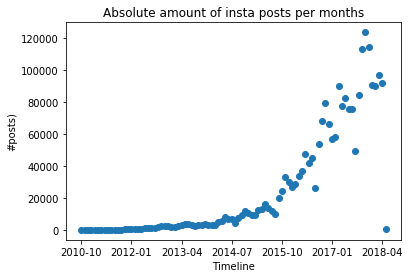

In [8]:
if 'Figures' not in os.listdir('.') and False:
    os.mkdir('Figures')
    os.mkdir('Figures/Shape')
    os.mkdir('Figures/Shape/Spatial')
    os.mkdir('Figures/Shape/Temporal')
plt.figure()
plt.scatter(list_dates, Npostslog)
plt.xticks(list_dates[0::15])
plt.ylabel(r'$log_{10}$(#posts)')
plt.xlabel('Timeline')
plt.title(r'$log_{10}$ of the amount of insta posts per months')
#plt.savefig('Figures/Shape/Temporal/Torino_logN.pdf')
plt.show()
plt.figure()
plt.scatter(list_dates, Nposts)
plt.xticks(list_dates[0::15])
plt.ylabel('#posts)')
plt.xlabel('Timeline')
plt.title('Absolute amount of insta posts per months')
#plt.savefig('Figures/Shape/Temporal/Torino_N.pdf')
plt.show()

In [9]:
df_location_all=pd.read_csv('Torino_data/torino_locations.csv', lineterminator='\n')
df_location_all=df_location_all.rename(columns = {'latitude':'lat','longitude':'lon', 'location_id':'id'})
df_location_all.head()

,id,name,lat,lon
0,135250610358325,WB Tattoos Art Gallery,45.072270,7.693010
1,346586842349479,InQubatore Qulturale,45.133572,7.631137
2,328277161003275,Mixed By Luca Pain,45.081999,7.661826
3,1022295605,06565,45.063780,7.681740
4,127109984575725,Café Müller,45.061100,7.676030


In [10]:
#remember zip:
zip([1,2,3],['a','b','c'])
#it's a function.
#make a new column 'coord' indexing (lat,lon) for each post
df_location_all['coord'] = list(zip(df_location_all.lat,df_location_all.lon))
df_location_all.head()

,id,name,lat,lon,coord
0,135250610358325,WB Tattoos Art Gallery,45.072270,7.693010,"(45.07227, 7.69301)"
1,346586842349479,InQubatore Qulturale,45.133572,7.631137,"(45.1335721884, 7.631136775)"
2,328277161003275,Mixed By Luca Pain,45.081999,7.661826,"(45.081999413, 7.6618255282)"
3,1022295605,06565,45.063780,7.681740,"(45.06378, 7.68174)"
4,127109984575725,Café Müller,45.061100,7.676030,"(45.0611, 7.67603)"


# Let's refine the DataFrame

In [11]:
#link postID with its location
dict_id_coord= dict(zip(df_location_all.id,df_location_all.coord))
dict_id_name= dict(zip(df_location_all.id,df_location_all.name))
dict_coord_name= dict(zip(df_location_all.coord,df_location_all.name))

series.map() matches corresponding entries from two different series files. This is what x.map(y) does:

In [26]:
x = pd.Series([1,2,3], index=['one', 'two', 'three'])
x

one      1
two      2
three    3
dtype: int64

In [27]:
y = pd.Series(['foo', 'bar', 'baz'], index=[1,2,3])
y

1    foo
2    bar
3    baz
dtype: object

In [20]:
x.map(y)

one      foo
two      bar
three    baz
dtype: object

In [24]:
z = pd.Series(['foo', 'bar', 'baz'], index=[3,1,2])
z

3    foo
1    bar
2    baz
dtype: object

In [25]:
x.map(z)

one      bar
two      baz
three    foo
dtype: object

In [12]:
#Adding a column 'coords' by mapping the coordinates to their location_id:
df_new['coords'] = df_new['location_id'].map(dict_id_coord)
# And a column 'name' by mapping the location ids to their associate name.
df_new['name'] = df_new['location_id'].map(dict_id_name)

#Create lat and lon columns by reading coords
# Look here: https://pythonhow.com/accessing-dataframe-columns-rows-and-cells/
df_new['lat']=[e[0] for e in df_new.loc[:,'coords']]
df_new['lon']=[e[1] for e in df_new.loc[:,'coords']]

# Drop duplicates
df_new.drop_duplicates(keep='first')
df_new.head()
#needs to be done at the end for compatibility reasons
# learn how to parse time here: https://www.tutorialspoint.com/python/time_strptime.htm

df_new['date']=[datetime.datetime.strptime(t,'%Y-%m-%d %H:%M:%S') for t in list(df_new['date'])]

In [13]:
df_new.dtypes

date           datetime64[ns]
text                   object
location_id             int64
coords                 object
name                   object
lat                   float64
lon                   float64
dtype: object

### Checkpoint 1

In [38]:
pickle.dump(df_new, open('PKL_files/df_new_chkpt1.pkl', 'wb'))

Build the frame and the grid. $$x_{min/max}=longitude_{min/max}$$ and conversely for y and latitude.

In [15]:

# Attention problème d'arrondi lors du passage de Coord à (lat,lon)
step_m=0.5
lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)
print (number_lats, number_lon)


(31.00000000000114, 31.000000000000007)


### Checkpoint 2

In [18]:
#pickle.dump(df_new, open('PKL_files/df_new_chkpt2.pkl', 'wb'))
df_new=pd.read_pickle('PKL_files/df_new_chkpt2.pkl')

In [40]:
df_new.text.tolist()[0]

'After great week to home of my Friend this sacred sleeve!! Thanx Marcus . Thanx for watch#walterbianco_wb #wbtattoos #wbtattooart #tattoo #sleevetattoo #rose #clouds #tatuaggio #iltatuaggio #tattooenergie #tattoolife #tattoomagazine #sacredhearttattoo #blackandwhite ndgraytattoo#italiantattooartist #torino #labellatorino #vanchiglia #instagram #instaart #instatattoo #tatuajes #tatuaje #tatuatori #tatuatoritorino #'

# Time to clean the text

But first make a copy before we do anything stupid

In [41]:
df_new_save=df_new.copy()
#df_new=df_new_save.copy()

This methods works only on unicode text. So we need to use the function x.decode('utf-8') to convert all strings in the 'text' field to unicode objects.

In [74]:
text_0=df_new['text'][22][0:11].decode('utf-8')
print text_0

purple 🤖


Another way to deal with emoji would be to de-emojize them. They would then count as words, that can either be removed
since they have the very peculiar following form :grinning_face: 

The difficulty here is identifying emojis in a text. Their classification is hard to decypher

In [ ]:
df_new=IL.text_processing(df_new)
#df_new=df_new[['date','lat','lon','latbin','lonbin','coords','text_new','name']]
df_new.drop(['text'],axis=1,inplace=True)
df_new=df_new.rename(columns = {'text_new':'text'})
df_new['coordsbin'] = list(zip(df_new.latbin,df_new.lonbin))
#print len(df_new_save.text.tolist()) - len(df_new.text.tolist()), 'posts deleted in the process'
df_new.head()

### Checkpoint 3

In [16]:
#And pickle it
#df_new.to_pickle('PKL_files/df_new_chkpt3.pkl')
df_new=pd.read_pickle('PKL_files/df_new_chkpt3.pkl')

In [14]:
if True:
    #In case I'm not loading this since the beginning
    dict_coord_name= dict(zip(df_new.coords,df_new.name))
    dict_name_coord= dict(zip(df_new.name,df_new.coords))
    step_m=0.5
    lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
    number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)

Learn about how groupby does not returns a dataframe but only groups the data IN ORDER TO APPLY SOME FUNCTION to it here: https://pandas.pydata.org/pandas-docs/stable/groupby.html

In [18]:
df_new_index,df_new_nodup2=IL.indexed_dataframe(df_new,step_lon,step_lat,number_lats)

How many spots? 5818


In [33]:
print len(set(df_new.coords.tolist())), 'different coords in the dataset'
print len(set(df_new.coordsbin.tolist())), 'different bins in the dataset'

5818 different coords in the dataset
518 different bins in the dataset


In [20]:
df_new_index=df_new[['date','text','coordsbin']]

In [21]:
df_new_index.head()

,date,text,coordsbin
0,2017-11-14 16:20:42,After great week to home of my Friend this sac...,"(45.072, 7.69115211839)"
1,2017-10-31 16:10:00,Fisrt Flower of my new style thanx Teresa than...,"(45.072, 7.69115211839)"
2,2017-10-16 15:22:37,This for new roses Thanx Simonewalterbiancowb ...,"(45.072, 7.69115211839)"
3,2017-10-05 15:40:03,New skull walterbiancowb wbtattooartgallery w...,"(45.072, 7.69115211839)"
4,2017-10-03 16:13:43,Paint acrilic biomech on sale cm X cm origi...,"(45.072, 7.69115211839)"


In [22]:
df_new_index['year_month'] = list(zip(df_new_index['date'].dt.year, df_new_index['date'].dt.month))

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [23]:
#Make an index of only the years + months and text of posts
df_new_index=df_new[['date','text','coordsbin']]
df_new_index['date'] = pd.to_datetime(df_new_index['date'], errors='coerce')
df_new_index['year_month'] = list(zip(df_new_index['date'].dt.year, df_new_index['date'].dt.month)) #add a month column
yearmin = min([y[0] for y in df_new_index.year_month.tolist()])

/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/eartiges/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [24]:
print df_new_index.shape
print len(df_new_index.text.tolist()), 'posts in df_new_index'
print 'among which',len(set(df_new_index.text.tolist())), 'are unique'

(2037329, 4)
2037329 posts in df_new_index
among which 1873850 are unique


# Checkpoint 4

In [82]:
#And pickle it
#df_new_index.to_pickle('PKL_files/df_new_index_chkpt4.pkl')
#df_new_index=pd.read_pickle('PKL_files/df_new_index_chkpt4.pkl')

In [29]:
all_dates=[s.date() for s in df_new_index.date.tolist()]
start=min(all_dates) #datetime(2010,10,1)
stop=max(all_dates) #datetime(2018,12,1)
flags=IL.TimeFlags(start,stop,'months',1)
slices=[(f,f+relativedelta(months=1)) for f in flags]

In [283]:
df_classified=IL.dataframe_classified(slices,df_new_index)
#df_classified.head()

2010-10-10 2010-11-10 28
2010-11-10 2010-12-10 45
2010-12-10 2011-01-10 53
2011-01-10 2011-02-10 68
2011-02-10 2011-03-10 116
2011-03-10 2011-04-10 205
2011-04-10 2011-05-10 156
2011-05-10 2011-06-10 118
2011-06-10 2011-07-10 145
2011-07-10 2011-08-10 115
2011-08-10 2011-09-10 79
2011-09-10 2011-10-10 160
2011-10-10 2011-11-10 181
2011-11-10 2011-12-10 214
2011-12-10 2012-01-10 276
2012-01-10 2012-02-10 294
2012-02-10 2012-03-10 289
2012-03-10 2012-04-10 452
2012-04-10 2012-05-10 643
2012-05-10 2012-06-10 990
2012-06-10 2012-07-10 973
2012-07-10 2012-08-10 729
2012-08-10 2012-09-10 860
2012-09-10 2012-10-10 1565
2012-10-10 2012-11-10 1804
2012-11-10 2012-12-10 1888
2012-12-10 2013-01-10 1590
2013-01-10 2013-02-10 1339
2013-02-10 2013-03-10 1510
2013-03-10 2013-04-10 1923
2013-04-10 2013-05-10 2476
2013-05-10 2013-06-10 2517
2013-06-10 2013-07-10 2648
2013-07-10 2013-08-10 2207
2013-08-10 2013-09-10 1857
2013-09-10 2013-10-10 2531
2013-10-10 2013-11-10 3092
2013-11-10 2013-12-10 2902
20

# Checkpoint 5

In [25]:
#And pickle it
#df_new.to_pickle('PKL_files/df_new_chkpt5.pkl')
#df_new_index.to_pickle('PKL_files/df_new_index_chkpt5.pkl')
#df_classified.to_pickle('PKL_files/df_classified_chkpt5.pkl')

df_new=pd.read_pickle('PKL_files/df_new_chkpt5.pkl')
df_new_index=pd.read_pickle('PKL_files/df_new_index_chkpt5.pkl')
df_classified=pd.read_pickle('PKL_files/df_classified_chkpt5.pkl')

In [30]:
if 1:
    step_m=.5
    all_dates=[s.date() for s in df_new_index.date.tolist()]
    start=min(all_dates) #datetime(2010,10,1)
    stop=max(all_dates) #datetime(2018,12,1)
    flags=IL.TimeFlags(start,stop,'months',1)
    slices=[(f,f+relativedelta(months=1)) for f in flags]
    lat1,lat2,step_lat,lon1,lon2,step_lon,to_bin_lon,to_bin_lat = IL.build_grid(df_new,step_m)
    number_lats,number_lon,df_new=IL.add_grid_todf(df_new,to_bin_lat,to_bin_lon,step_lat,step_lon)
    print (number_lats, number_lon)
    #Make an index of only the years + months and text of posts
    gc.collect()

(31.00000000000114, 31.000000000000007)


# Term vector building by NTF

Stemming = removing all suffixes in the word to keep only its root.

This part executes NMF on time slices of the data, to have an idea of what the output might be. It generates .mat files that can be used by matlab.

More about NMF here: https://scikit-learn.org/stable/modules/decomposition.html#nmf

More info about countvectorizer here: 
https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

And about TfIdf: 
https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfTransformer.html

And about NMF:
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html

In [31]:
lang = detect("Ein, zwei, drei, vier")
# it for italian, en for english
class StemmedCountVectorizer(CountVectorizer):
    # This class is basically a CountVectorizer class that has been enhanced with a stemmer method.
    def build_analyzer(self):
        #Use super to access the method build_analyzer form the class CountVectorizer.
        analyzer = super(StemmedCountVectorizer, self).build_analyzer()
        #return lambda doc: ([italian_stemmer.stem(w) for w in analyzer(doc)])
        return lambda doc: ([self.stemmer(w) for w in analyzer(doc)])
    
    def stemmer(self, w):
        if langid.classify(w)=='it':
            return italian.stemmer(w)
        elif langid.classify(w)=='en':
            return english.stemmer(w)
        else:
            return w
        
    def language_detector(w):
        try:
            return langid.classify(w)[0]
        except LangDetectException:
            return 'emoji'
    

In [148]:
import gensim
model_1= gensim.models.Word2Vec(IL.sentences,iter=1,workers=32,window=5)
#model_1.wv.most_similar('negro')
model_1.wv.most_similar(positive=['rushclub'])

2019-03-01 15:51:27,539 : INFO : collecting all words and their counts
2019-03-01 15:51:27,604 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2019-03-01 15:51:27,859 : INFO : PROGRESS: at sentence #10000, processed 139356 words, keeping 37885 word types
2019-03-01 15:51:27,898 : INFO : PROGRESS: at sentence #20000, processed 279132 words, keeping 63348 word types
2019-03-01 15:51:27,936 : INFO : PROGRESS: at sentence #30000, processed 417329 words, keeping 84210 word types
2019-03-01 15:51:27,977 : INFO : PROGRESS: at sentence #40000, processed 558477 words, keeping 102700 word types
2019-03-01 15:51:28,033 : INFO : PROGRESS: at sentence #50000, processed 697955 words, keeping 123140 word types
2019-03-01 15:51:28,077 : INFO : PROGRESS: at sentence #60000, processed 856307 words, keeping 143127 word types
2019-03-01 15:51:28,123 : INFO : PROGRESS: at sentence #70000, processed 1023878 words, keeping 164052 word types
2019-03-01 15:51:28,172 : INFO : PROGRESS

2019-03-01 15:51:31,342 : INFO : PROGRESS: at sentence #710000, processed 10553735 words, keeping 878466 word types
2019-03-01 15:51:31,387 : INFO : PROGRESS: at sentence #720000, processed 10692990 words, keeping 888148 word types
2019-03-01 15:51:31,434 : INFO : PROGRESS: at sentence #730000, processed 10848400 words, keeping 895906 word types
2019-03-01 15:51:31,476 : INFO : PROGRESS: at sentence #740000, processed 10982388 words, keeping 903214 word types
2019-03-01 15:51:31,523 : INFO : PROGRESS: at sentence #750000, processed 11131850 words, keeping 909423 word types
2019-03-01 15:51:31,572 : INFO : PROGRESS: at sentence #760000, processed 11292771 words, keeping 918469 word types
2019-03-01 15:51:31,614 : INFO : PROGRESS: at sentence #770000, processed 11425743 words, keeping 926266 word types
2019-03-01 15:51:31,656 : INFO : PROGRESS: at sentence #780000, processed 11559791 words, keeping 933087 word types
2019-03-01 15:51:31,705 : INFO : PROGRESS: at sentence #790000, processe

2019-03-01 15:51:34,657 : INFO : PROGRESS: at sentence #1410000, processed 21105639 words, keeping 1332350 word types
2019-03-01 15:51:34,702 : INFO : PROGRESS: at sentence #1420000, processed 21252183 words, keeping 1337246 word types
2019-03-01 15:51:34,768 : INFO : PROGRESS: at sentence #1430000, processed 21417571 words, keeping 1340999 word types
2019-03-01 15:51:34,823 : INFO : PROGRESS: at sentence #1440000, processed 21607511 words, keeping 1351619 word types
2019-03-01 15:51:34,867 : INFO : PROGRESS: at sentence #1450000, processed 21750206 words, keeping 1356721 word types
2019-03-01 15:51:34,911 : INFO : PROGRESS: at sentence #1460000, processed 21888727 words, keeping 1364291 word types
2019-03-01 15:51:34,954 : INFO : PROGRESS: at sentence #1470000, processed 22036629 words, keeping 1366907 word types
2019-03-01 15:51:35,008 : INFO : PROGRESS: at sentence #1480000, processed 22214768 words, keeping 1375111 word types
2019-03-01 15:51:35,043 : INFO : PROGRESS: at sentence #

2019-03-01 15:51:37,987 : INFO : PROGRESS: at sentence #2110000, processed 31818195 words, keeping 1730081 word types
2019-03-01 15:51:38,039 : INFO : PROGRESS: at sentence #2120000, processed 31990742 words, keeping 1737122 word types
2019-03-01 15:51:38,082 : INFO : PROGRESS: at sentence #2130000, processed 32131233 words, keeping 1741997 word types
2019-03-01 15:51:38,134 : INFO : PROGRESS: at sentence #2140000, processed 32314627 words, keeping 1747971 word types
2019-03-01 15:51:38,175 : INFO : PROGRESS: at sentence #2150000, processed 32445227 words, keeping 1752490 word types
2019-03-01 15:51:38,220 : INFO : PROGRESS: at sentence #2160000, processed 32596886 words, keeping 1757639 word types
2019-03-01 15:51:38,269 : INFO : PROGRESS: at sentence #2170000, processed 32763273 words, keeping 1761675 word types
2019-03-01 15:51:38,322 : INFO : PROGRESS: at sentence #2180000, processed 32933791 words, keeping 1769433 word types
2019-03-01 15:51:38,367 : INFO : PROGRESS: at sentence #

2019-03-01 15:51:41,333 : INFO : PROGRESS: at sentence #2810000, processed 42441074 words, keeping 2025649 word types
2019-03-01 15:51:41,385 : INFO : PROGRESS: at sentence #2820000, processed 42621377 words, keeping 2025649 word types
2019-03-01 15:51:41,435 : INFO : PROGRESS: at sentence #2830000, processed 42789996 words, keeping 2025649 word types
2019-03-01 15:51:41,485 : INFO : PROGRESS: at sentence #2840000, processed 42954193 words, keeping 2025649 word types
2019-03-01 15:51:41,536 : INFO : PROGRESS: at sentence #2850000, processed 43124304 words, keeping 2025649 word types
2019-03-01 15:51:41,589 : INFO : PROGRESS: at sentence #2860000, processed 43303884 words, keeping 2025649 word types
2019-03-01 15:51:41,644 : INFO : PROGRESS: at sentence #2870000, processed 43485760 words, keeping 2025649 word types
2019-03-01 15:51:41,766 : INFO : PROGRESS: at sentence #2880000, processed 43626516 words, keeping 2025649 word types
2019-03-01 15:51:41,803 : INFO : PROGRESS: at sentence #

2019-03-01 15:51:44,820 : INFO : PROGRESS: at sentence #3510000, processed 53191430 words, keeping 2026366 word types
2019-03-01 15:51:44,870 : INFO : PROGRESS: at sentence #3520000, processed 53360009 words, keeping 2026366 word types
2019-03-01 15:51:44,918 : INFO : PROGRESS: at sentence #3530000, processed 53515770 words, keeping 2026366 word types
2019-03-01 15:51:44,962 : INFO : PROGRESS: at sentence #3540000, processed 53652499 words, keeping 2026366 word types
2019-03-01 15:51:45,003 : INFO : PROGRESS: at sentence #3550000, processed 53784212 words, keeping 2026366 word types
2019-03-01 15:51:45,064 : INFO : PROGRESS: at sentence #3560000, processed 53942264 words, keeping 2026366 word types
2019-03-01 15:51:45,107 : INFO : PROGRESS: at sentence #3570000, processed 54080241 words, keeping 2026366 word types
2019-03-01 15:51:45,231 : INFO : PROGRESS: at sentence #3580000, processed 54262437 words, keeping 2026366 word types
2019-03-01 15:51:45,283 : INFO : PROGRESS: at sentence #

2019-03-01 15:52:06,165 : INFO : EPOCH 1 - PROGRESS: at 14.73% examples, 979800 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:07,192 : INFO : EPOCH 1 - PROGRESS: at 16.07% examples, 952225 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:08,188 : INFO : EPOCH 1 - PROGRESS: at 18.06% examples, 962287 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:09,190 : INFO : EPOCH 1 - PROGRESS: at 20.00% examples, 968744 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:10,199 : INFO : EPOCH 1 - PROGRESS: at 21.99% examples, 977393 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:11,213 : INFO : EPOCH 1 - PROGRESS: at 23.29% examples, 962319 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:12,224 : INFO : EPOCH 1 - PROGRESS: at 25.20% examples, 968778 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:13,233 : INFO : EPOCH 1 - PROGRESS: at 27.17% examples, 971131 words/s, in_qsize 0, out_qsize 0
2019-03-01 15:52:14,236 : INFO : EPOCH 1 - PROGRESS: at 29.02% examples, 975344 words/s, in_qsiz

2019-03-01 15:52:55,590 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-03-01 15:52:55,591 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-03-01 15:52:55,592 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-03-01 15:52:55,593 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-03-01 15:52:55,595 : INFO : EPOCH - 1 : training on 61699535 raw words (54964453 effective words) took 57.5s, 956410 effective words/s
2019-03-01 15:52:55,596 : INFO : training on a 61699535 raw words (54964453 effective words) took 57.5s, 956287 effective words/s


In [32]:
#Do you want your dataset indexed by tweets
if False:
    df_trial=df_new[['date','text']]
    df_trial['daily_date']=df_trial.date.apply(lambda x:x.date())
    df_trial['year_month']=df_trial.date.apply(lambda x:datetime.date(x.year,x.month,1))
    df_tri_classified=df_trial.pivot(columns='year_month',values='text').fillna('')
    flags=df_tri_classified.columns.tolist()
    df_trial.set_index(['year_month','date'])

In [124]:
reload(IL)
start_spl=flags[30]
stop_spl=flags[-1]
n_topics=23
n_features=5000
#df_classified=pd.read_pickle('PKL_files/df_classified_chkpt5.pkl')

sampling=True
mat_export=True
seeded=False
expanded=False

#Filter out the monuments?
monuments=True

#df_classified=pd.read_pickle('PKL_files/df_classified_chkpt5.pkl')

all_stopwords=IL.stopwords(monuments)

if seeded and not expanded:
    df_word2vec=IL.df_seeding(df_classified, seed)
    list_reviews_all=df_word2vec.result.tolist()
elif expanded:
    df_word2vec=IL.df_expanded_seeding(df_classified, seed,model=model_1)
    list_reviews_all=df_word2vec.result.tolist()
else:
    list_reviews_all=df_classified.result.tolist()

#Build the vectorizer and the list of all words in the dataset
vectorizer_s = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords)     
while '' in list_reviews_all:
    list_reviews_all.remove('')
while "" in list_reviews_all:
    list_reviews_all.remove("")

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Matlab help 
### optional

In [10]:
df_toNTF=IL.dataframe_sampled(df_classified,start_spl)
counts = vectorizer_s.fit_transform([''.join(list(set(df_toNTF[col].tolist()))) for col in df_toNTF.columns])
vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 

The threshold is 2796


/home/eartiges/.local/lib/python2.7/site-packages/sklearn/feature_extraction/text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['lamiacitt', 'torino\xc3'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [17]:
#if not vectorizer_new:
#    print 'No vectorizer defined. Returning None'
#    return None
name_matlab='CC_matlab/Matr{}_'.format(n_features)
snapshots=df_classified.columns.tolist()[0:-1]        
#For every snapshot taken
ct=0
TF_IDFs=[]
for month in snapshots:
    break
    ct+=1
    This_Month=df_classified[month].tolist()
    # Learn the vocabulary dictionary and return term-document matrix.
    counts = vectorizer_new.transform(This_Month)
    #Transform a count matrix to a normalized tf-idf representation. 
    #(i.e terms with frequencies too hi or lo are removed)
    # Weights are indexed by (postID, term): weight
    tfidf = TfidfTransformer().fit_transform(counts)
    savemat(name_matlab+str(ct), {'tfidf':tfidf})
    TF_IDFs.append(tfidf)
list_idn, list_CCs,list_Q=eng.CC_matlab(1,len(snapshots),name_matlab,3,1,nargout=3)

MatlabExecutionError: Output argument "list_Q" (and maybe others) not assigned during call to "CC_matlab".


In [122]:
import matlab
from matlab import engine
eng=matlab.engine.start_matlab()

In [113]:
os.getcwd()

'/home/eartiges/Lagrange_Git'

In [116]:
os.chdir('..')

In [123]:
list_idn, list_CCs,list_Q=eng.CC_matlab(1,len(snapshots),name_matlab,30,3,nargout=3)

MatlabExecutionError: 
  File /home/eartiges/Lagrange_Git/CC_matlab.m, line 41, in CC_matlab
Undefined function 'ncp' for input arguments of type 'sptensor'.


In [ ]:
list_mean_cc=[np.mean(d) for d in list_CCs[1:]]
list_std_cc=[np.std(d) for d in list_CCs[1:]]

In [74]:
os.chdir('..')

In [57]:
os.chdir('Instagram')
list_CCs,TF_IDFs,list_lbda_Q = IL.CC_matlab(df_classified,vectorizer_new,n_features,R_f=3, nb_s=1, path='CC_matlab/')

KeyboardInterrupt: 

In [129]:
os.getcwd()

'/home/eartiges/Lagrange_Git/Instagram'

In [131]:
os.chdir('..')

In [134]:
#It should be around 23
# https://it.mathworks.com/help/matlab/matlab_external/handling-data-returned-from-python.html
#os.chdir('Instagram')
list_CCs,TF_IDFs,list_lbda_Q = IL.CC_matlab(df_classified,vectorizer_new,n_features,R_f=30, nb_s=3, path='CC_matlab/')
list_mean_cc=[np.mean(d) for d in list_CCs[1:]]
list_std_cc=[np.std(d) for d in list_CCs[1:]]
#os.chdir('..')

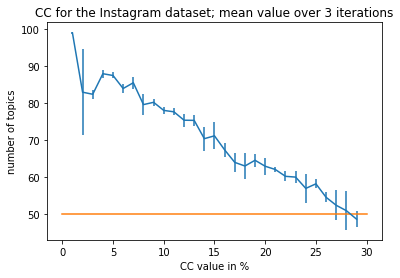

In [138]:
plt.figure()
plt.errorbar([i+1 for i,j in enumerate(list_mean_cc)],list_mean_cc,yerr=list_std_cc)
plt.plot([0,30],[50,50])
plt.title('CC for the Instagram dataset; mean value over 3 iterations')
plt.xlabel('CC value in %')
plt.ylabel('number of topics')
plt.show()
plt.close()

In [324]:
seed=''
n_topics=8
df_toNTF=df_classified
path=IL.file_tree2(seeded,expanded,n_features,sampling,flags,start_spl,n_topics,monuments,len(list_reviews_all),seed=seed)
A,B,C,TermVectorsIndex,TermVectors,lambdas = IL.NTF_sampling_fromtfidf(sampling,df_toNTF,TF_IDFs,flags,start_spl,stop_spl,path, vectorizer_new=vectorizer_new,vectorizer_s=vectorizer_s,n_topics=n_topics,n_features=n_features,matlab=mat_export,monuments=monuments)       
for tvi in TermVectorsIndex:
        print TermVectorsIndex.index(tvi), lambdas[TermVectorsIndex.index(tvi)], [t[0] for t in tvi[0:8]]

1
0 1.0 [u'happy', u'day', u'night', u'party', u'fun', u'summer', u'girl', u'cute']
1 1.0 [u'valentino', u'parco', u'park', u'po', u'castello', u'nature', u'relax', u'sun']
2 1.0 [u'mole', u'moleantonelliana', u'cinema', u'museo', u'sky', u'piemonte', u'city', u'museum']
3 1.0 [u'venaria', u'reale', u'palace', u'piemonte', u'architecture', u'nature', u'giardini', u'art']
4 1.0 [u'murazzi', u'po', u'river', u'night', u'fiume', u'sunset', u'piazzavittorio', u'cappuccini']
5 1.0 [u'piazza', u'night', u'piazzacastello', u'city', u'carlo', u'san', u'sky', u'piemonte']
6 1.0 [u'eataly', u'pizza', u'fiat', u'pasta', u'gnam', u'cheese', u'buon', u'appetito']
7 1.0 [u'sushi', u'dinner', u'japanese', u'pranzo', u'relax', u'buon', u'yummy', u'donna']


2019-03-07 11:41:20,665 : INFO : Failed to auto identify EPSG: 7


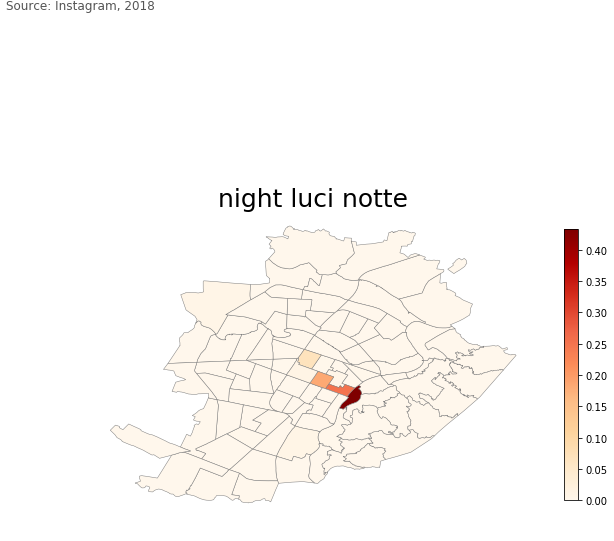

file saved Results/2019-03-06_9_5000_#2/Heatmaps/night_luci_notte


2019-03-07 11:41:21,928 : INFO : Failed to auto identify EPSG: 7


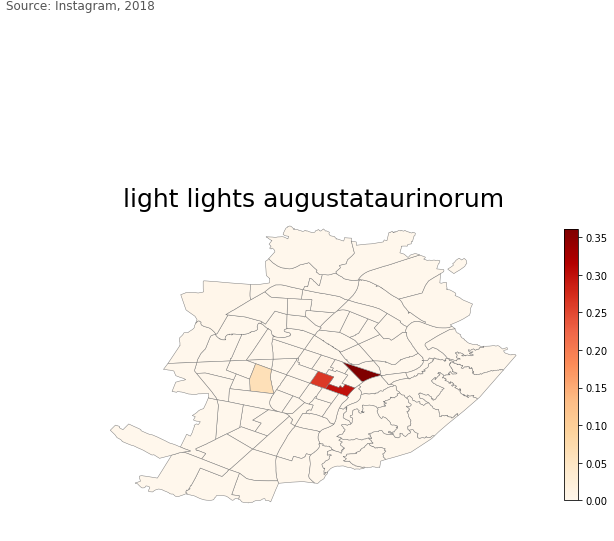

2019-03-07 11:41:22,850 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/light_lights_augustataurinorum


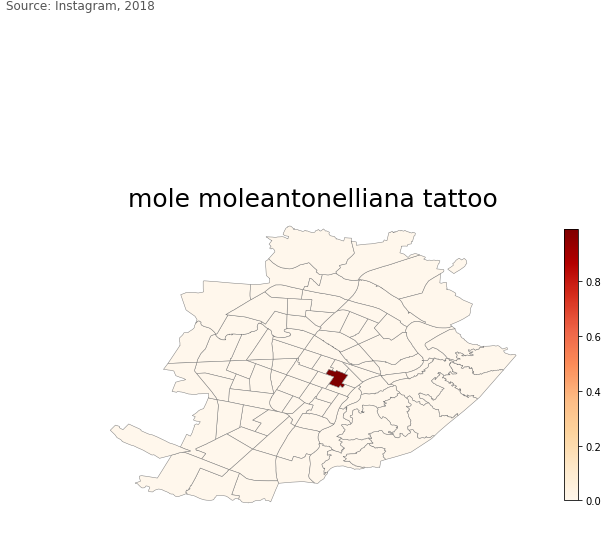

2019-03-07 11:41:23,744 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/mole_moleantonelliana_tattoo


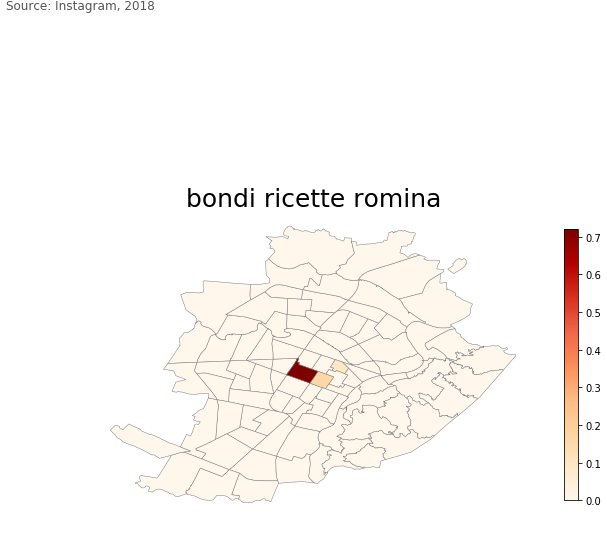

2019-03-07 11:41:24,655 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/bondi_ricette_romina


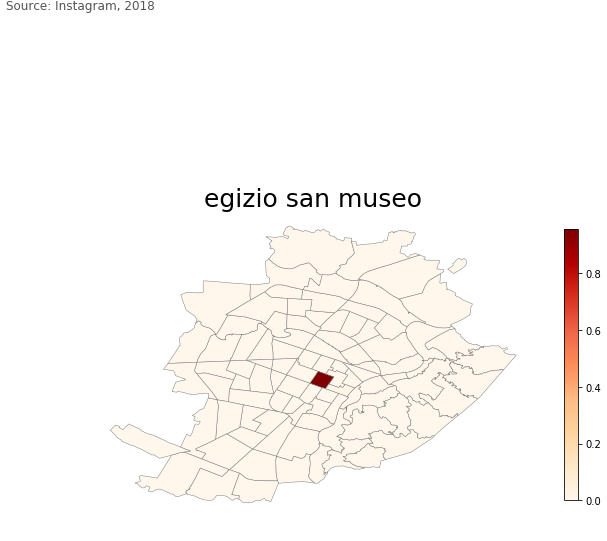

2019-03-07 11:41:25,552 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/egizio_san_museo


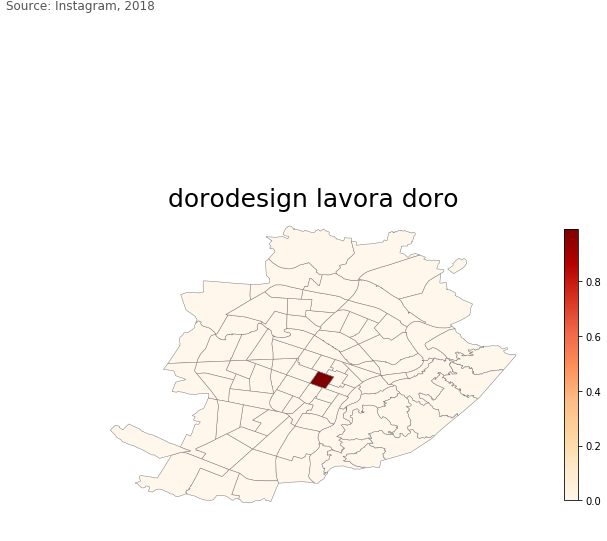

2019-03-07 11:41:26,456 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/dorodesign_lavora_doro


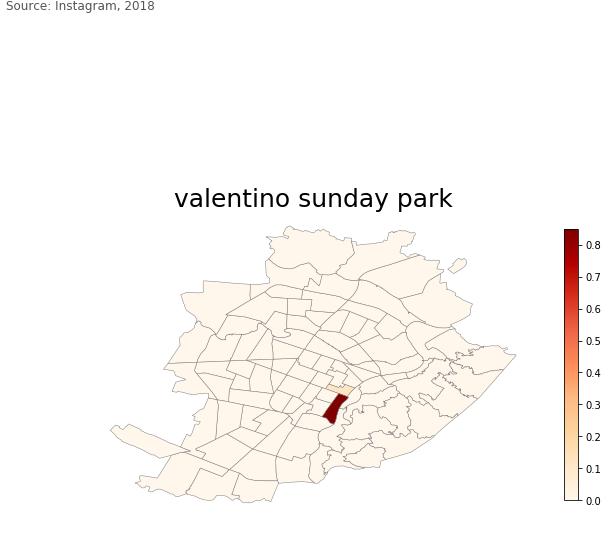

2019-03-07 11:41:27,382 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/valentino_sunday_park


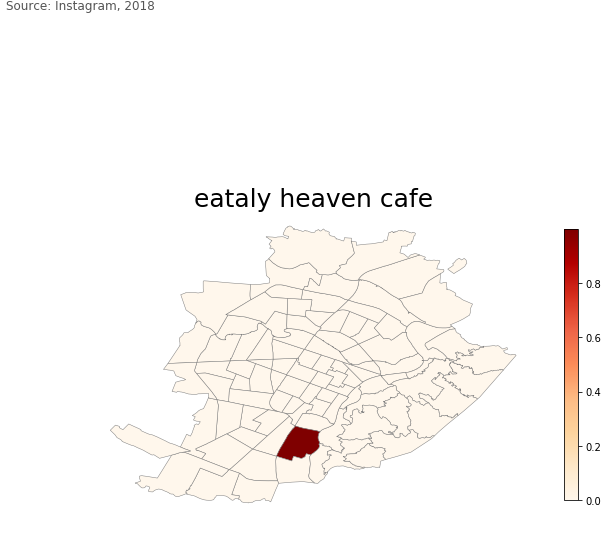

2019-03-07 11:41:28,556 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-06_9_5000_#2/Heatmaps/eataly_heaven_cafe


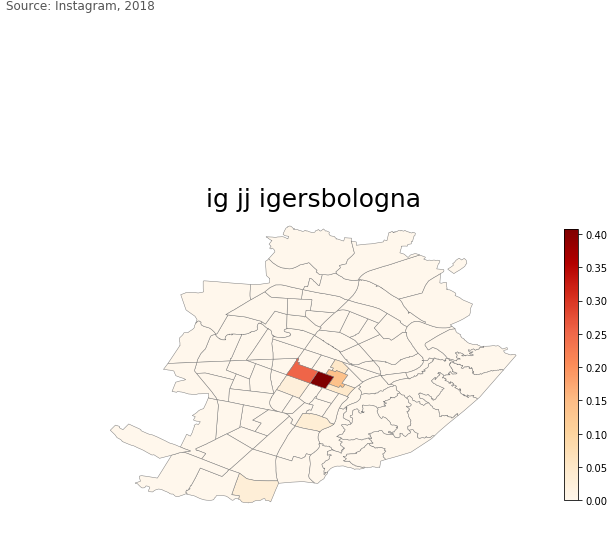

file saved Results/2019-03-06_9_5000_#2/Heatmaps/ig_jj_igersbologna


In [282]:
for i in range(0,len(A.T)):
    Coordinates=list(df_toNTF.index)
    row=A.T[i]
    topic=''
    for j in (0,1,2):
        topic+='_'+TermVectorsIndex[i][j][0]
    #IL.geo_topic(row,Coordinates,i,topic=topic,save=True,folder=path+'Heatmaps/')
    IP.geo_hm_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=True,folder=path+'Heatmaps/',shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')
    #IP.geo_plot_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=True,folder=path+'Heatmaps/',shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')


# Back to Python

In [38]:
seed=''
os.chdir('Lagrange_Git')

In [125]:
ALL_RESULTS=[]
for i in range(50):
    reload(IL)
    path=IL.file_tree2(seeded,expanded,n_features,sampling,flags,start_spl,n_topics,monuments,len(list_reviews_all),seed=seed)
    if sampling:
        print 'SPL'
        df_toNTF=IL.dataframe_sampled(df_classified,start_spl)
        try:
            df_toNTF.drop('result', axis=1,inplace=True)
        except KeyError:
            print('Key Error')
            pass
        counts = vectorizer_s.fit_transform([''.join(list(set(df_toNTF[col].tolist()))) for col in df_toNTF.columns])
        vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 
        voc_vector={k:v for v,k in vectorizer_s.vocabulary_.iteritems()}
        voc_serie=pd.Series(voc_vector)
        feature_names = vectorizer_s.get_feature_names()
    else:
        if seeded or expanded:
            print 'seed or W2V'
            df_toNTF=df_word2vec
        else:    
            df_toNTF=df_classified
        try:
            df_toNTF.drop('result', axis=1,inplace=True)
        except KeyError:
            pass
        counts = vectorizer_s.fit_transform(list_reviews_all)
        vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 
        voc_vector={k:v for v,k in vectorizer_s.vocabulary_.iteritems()}
        voc_serie=pd.Series(voc_vector)
        feature_names = vectorizer_s.get_feature_names()
    A,B,C,TermVectorsIndex,TermVectors,lambdas = IL.NTF_sampling(sampling,df_toNTF,flags,start_spl,stop_spl,path, vectorizer_new=vectorizer_new,vectorizer_s=vectorizer_s,n_topics=n_topics,n_features=n_features,matlab=mat_export,monuments=monuments)       
    for tvi in TermVectorsIndex:
        print TermVectorsIndex.index(tvi), lambdas[TermVectorsIndex.index(tvi)], [t[0] for t in tvi[0:8]]
    ALL_RESULTS.append([A,B,C,TermVectorsIndex,])

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'pav', u'arte', u'contemporaryart', u'artecontemporanea', u'pran

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'nekocafe', u'cats', u'catsofinstagram', u'cat', u'catlover', u'

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'tattoo', u'ink', u'tattoos', u'inked', u'redstroketattoo', u'

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'dance', u'incognito', u'class', u'followus', u'work', u'cho

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'po', u'river', u'murazzi', u'ponteisabella', u'catullo', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'artissima', u'art', u'contemporaryart', u'studio', u'ar

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'eataly', u'fiat', u'gallery', u'piemonte', u'agnelli'

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'parco', u'autumn', u'park', u'nature', u'running', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'art', u'architecture', u'city', u'piemonte', u'to

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'music', u'live', u'spazio', u'party', u'rock',

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'nekocafe', u'cats', u'catsofinstagram', u'c

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'basketmaniahoops', u'store', u'adidas', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'pizza', u'dinner', u'yummy', u'cena',

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'tattoo', u'ink', u'tattoos', u'ink

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'summer', u'relax', u'piscina', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'po', u'murazzi', u'river', u

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'dance', u'choreography', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'nature', u'parco', u'p

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'sushi', u'sushitime

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'eataly', u'galle

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'barbershop', 

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'barbershop

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'po', u'

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'wedd

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [u'p

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.0 [

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0 1.

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
518
0

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10
51

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03-10

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018-03

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2018

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
518
2

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10
51

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02-10

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018-02

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2018

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
518
2

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10
51

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01-10

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018-01

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2018

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
518
2

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10
51

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12-10

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017-12

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2017

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
518
2

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10
51

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


1
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
SPL
The threshold is 2796
2013-04-10
518
2013-05-10
518
2013-06-10
518
2013-07-10
518
2013-08-10
518
2013-09-10
518
2013-10-10
518
2013-11-10
518
2013-12-10
518
2014-01-10
518
2014-02-10
518
2014-03-10
518
2014-04-10
518
2014-05-10
518
2014-06-10
518
2014-07-10
518
2014-08-10
518
2014-09-10
518
2014-10-10
518
2014-11-10
518
2014-12-10
518
2015-01-10
518
2015-02-10
518
2015-03-10
518
2015-04-10
518
2015-05-10
518
2015-06-10
518
2015-07-10
518
2015-08-10
518
2015-09-10
518
2015-10-10
518
2015-11-10
518
2015-12-10
518
2016-01-10
518
2016-02-10
518
2016-03-10
518
2016-04-10
518
2016-05-10
518
2016-06-10
518
2016-07-10
518
2016-08-10
518
2016-09-10
518
2016-10-10
518
2016-11-10
518
2016-12-10
518
2017-01-10
518
2017-02-10
518
2017-03-10
518
2017-04-10
518
2017-05-10
518
2017-06-10
518
2017-07-10
518
2017-08-10
518
2017-09-10
518
2017-10-10
518
2017-11-10

In [126]:
pickle.dump(ALL_RESULTS, open('all_results_noMon.pkl', 'wb'))

In [127]:
pickle.dump(voc_vector, open('voc_vector_noMon.pkl', 'wb'))

In [141]:
A_norm=np.array(A)
for i,a in enumerate(A):
    N=np.sqrt(sum([e**2 for e in a]))
    if N!=0:
        A_norm[i]=[e/N for e in a]
    else:
        A_norm[i]=a

In [142]:
A_classified=np.array(A_norm[0])
for i in range(A_norm.shape[1]):
    for j,a in enumerate(A_norm):
        if np.argmax(a)==i:
            A_classified=np.append(A_classified,a)

ValueError: need more than 1 value to unpack

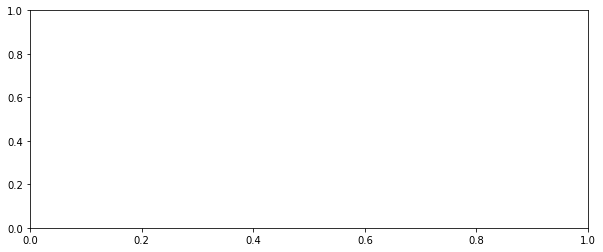

In [143]:
#Topics by user
plt.figure(figsize=(10,4))
plt.pcolormesh(A_classified.T)#, cmap=plt.cm.Greys)
plt.xlim(0,A.shape[0])
plt.yticks(np.arange(B.shape[1])+0.5, np.arange(0,B.shape[1]+1))
#plt.savefig('Topic_bybin_normalized.pdf')
plt.show()

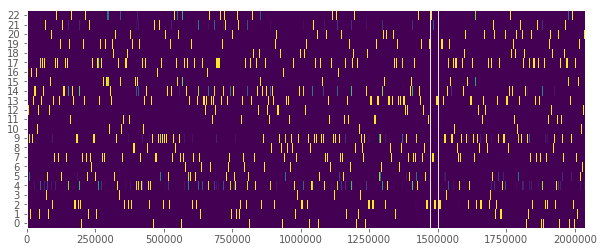

In [194]:
#Topics by user
plt.figure(figsize=(10,4))
plt.pcolormesh(A_norm.T)#, cmap=plt.cm.Greys)
plt.xlim(0,A.shape[0])
plt.yticks(np.arange(B.shape[1])+0.5, np.arange(0,B.shape[1]+1))
#plt.savefig('Topic_bybin_normalized.pdf')
plt.show()

In [144]:
for tvi in TermVectorsIndex:
        print TermVectorsIndex.index(tvi), lambdas[TermVectorsIndex.index(tvi)], [t[0] for t in tvi[0:8]]

0 1.0 [u'night', u'happy', u'day', u'summer', u'sun', u'sky', u'fun', u'piazza']
1 1.0 [u'gym', u'fitness', u'workout', u'palestra', u'training', u'motivation', u'bodybuilding', u'sport']
2 1.0 [u'fashion', u'summer', u'girl', u'happy', u'cute', u'fun', u'style', u'swag']
3 1.0 [u'barbershop', u'hair', u'haircut', u'barber', u'hairstyle', u'barberlife', u'barbering', u'barbersinctv']
4 1.0 [u'collegno', u'giovioesilvestro', u'hair', u'rivoli', u'hairstyle', u'grugliasco', u'balayage', u'alpignano']
5 1.0 [u'artissima', u'contemporaryart', u'art', u'dancehall', u'studio', u'studiotorino', u'hotel', u'arte']
6 1.0 [u'eataly', u'fiat', u'white', u'pasta', u'eat', u'gallery', u'troppo', u'stasera']
7 1.0 [u'sushi', u'japanese', u'dinner', u'sashimi', u'sushitime', u'japanesefood', u'metroquadro', u'metroquadroabbigliamento']
8 1.0 [u'basket', u'palaruffini', u'pmstorino', u'pallacanestro', u'pms', u'vs', u'seriea', u'gara']
9 1.0 [u'basketmaniahoops', u'store', u'adidasbasketball', u'adida

In [145]:
f=open(path+'TermVectors.txt','w')
for tvi in TermVectorsIndex[::-1]:
    f.write(str(TermVectorsIndex.index(tvi))+ ' '+str([t[0] for t in tvi[0:10]])+'\n')
f.close()

pickle.dump(A, open(path+'pickle/A.pkl','wb'))
pickle.dump(B, open(path+'pickle/B.pkl','wb'))
pickle.dump(C, open(path+'pickle/C.pkl','wb'))
pickle.dump(df_toNTF.index.tolist(), open(path+'pickle/Grid.pkl','wb'))
pickle.dump(df_toNTF.columns.tolist(), open(path+'pickle/timeline.pkl','wb'))
f = open(path+'pickle/Vocabulary.csv', 'w')
for item in feature_names:
    f.write("%s\n" % item.encode('utf-8'))
f.close()

In [147]:
TermVectors2=open(path+'TermVectors.txt', 'r').readlines()[::-1]

[nltk_data] Downloading package punkt to /home/eartiges/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
2019-03-25 14:07:16,701 : INFO : Failed to auto identify EPSG: 7


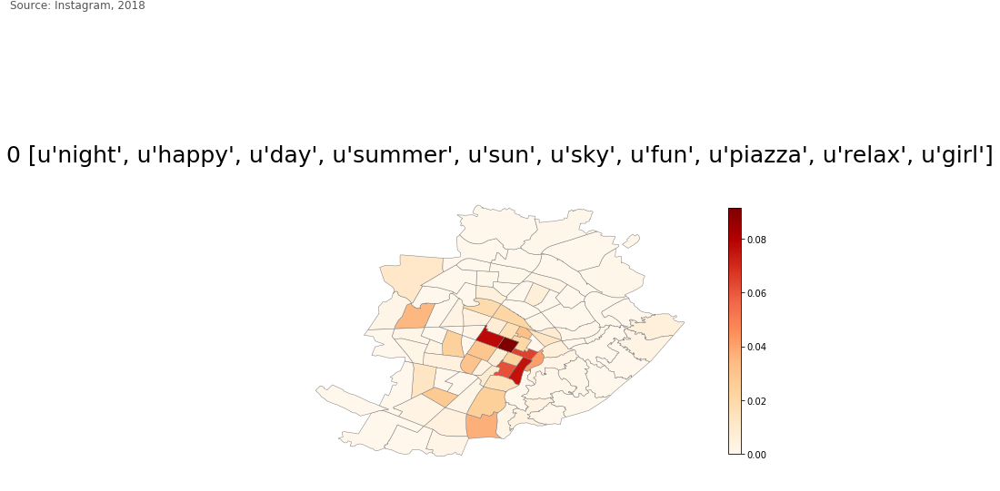

2019-03-25 14:07:19,282 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/0_[u'night',_u'happy',_u'day',_u'summer',_u'sun',_u'sky',_u'fun',_u'piazza',_u'relax',_u'girl']



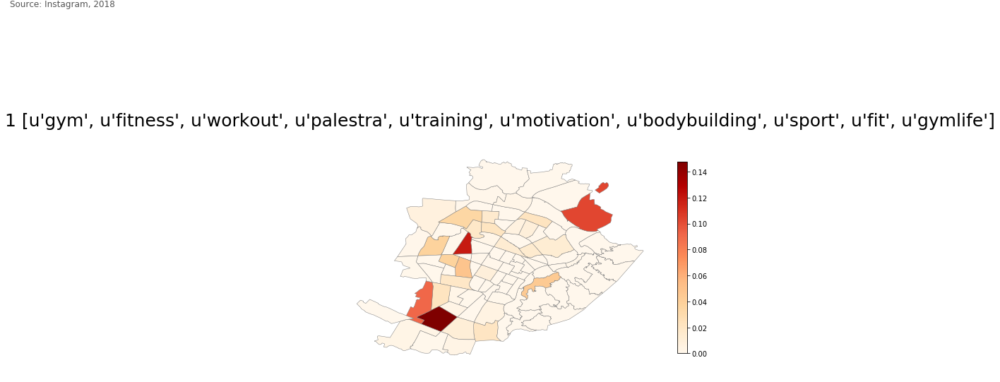

file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/1_[u'gym',_u'fitness',_u'workout',_u'palestra',_u'training',_u'motivation',_u'bodybuilding',_u'sport',_u'fit',_u'gymlife']



2019-03-25 14:07:22,027 : INFO : Failed to auto identify EPSG: 7


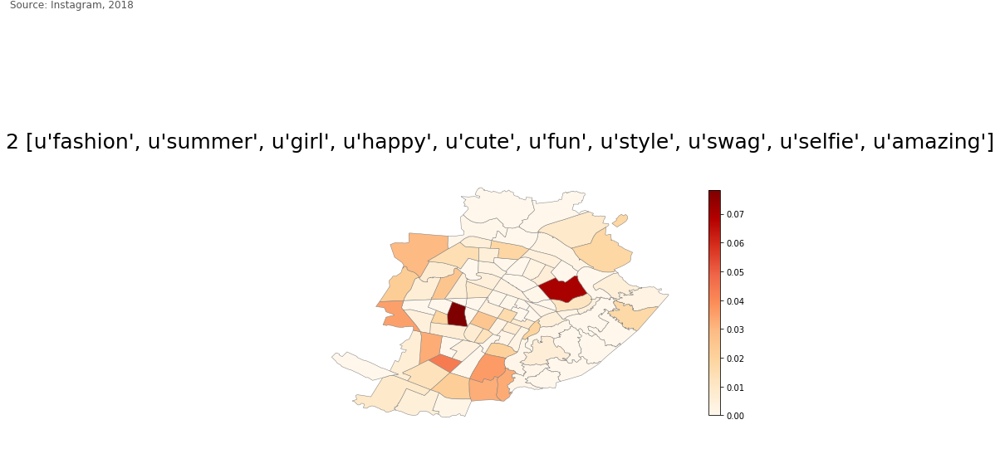

2019-03-25 14:07:24,633 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/2_[u'fashion',_u'summer',_u'girl',_u'happy',_u'cute',_u'fun',_u'style',_u'swag',_u'selfie',_u'amazing']



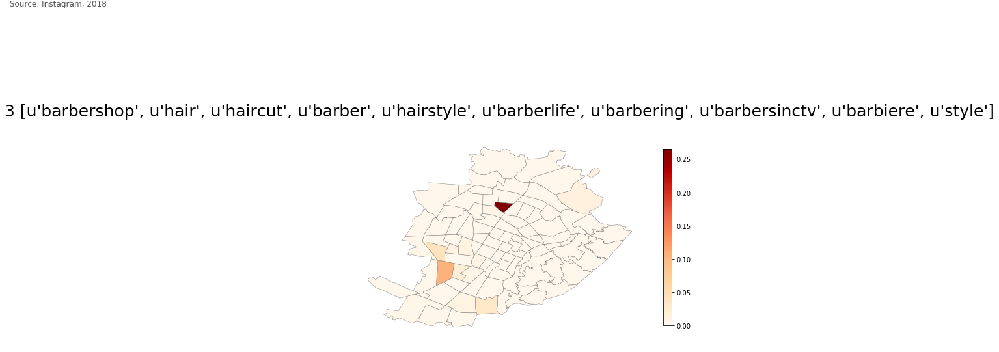

2019-03-25 14:07:27,268 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/3_[u'barbershop',_u'hair',_u'haircut',_u'barber',_u'hairstyle',_u'barberlife',_u'barbering',_u'barbersinctv',_u'barbiere',_u'style']



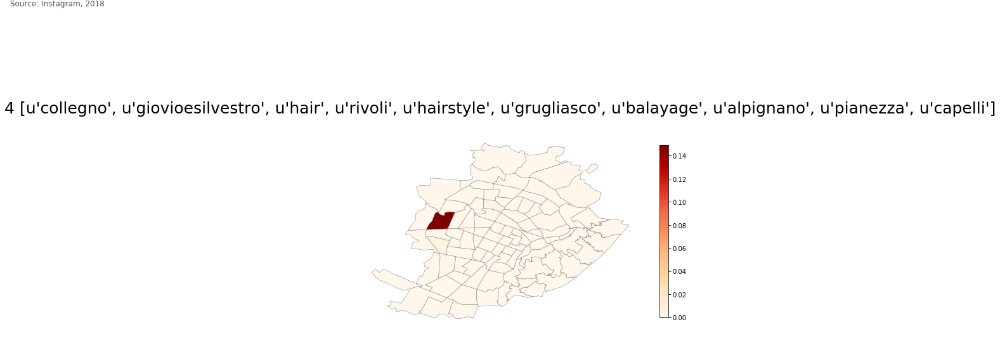

2019-03-25 14:07:30,667 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/4_[u'collegno',_u'giovioesilvestro',_u'hair',_u'rivoli',_u'hairstyle',_u'grugliasco',_u'balayage',_u'alpignano',_u'pianezza',_u'capelli']



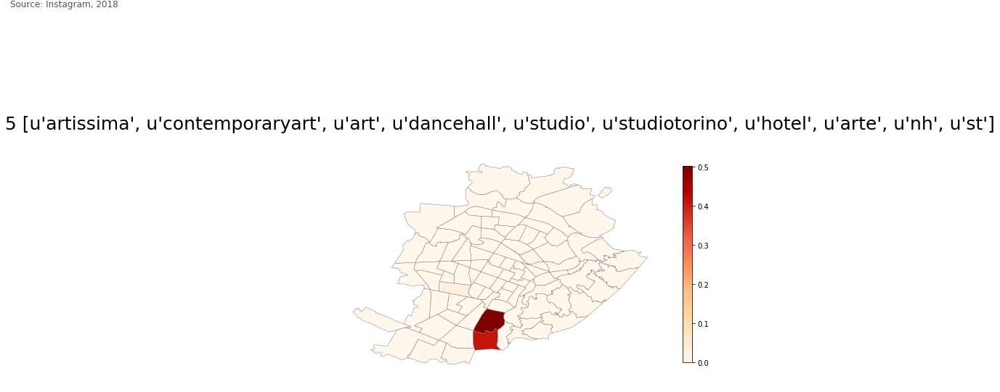

2019-03-25 14:07:33,293 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/5_[u'artissima',_u'contemporaryart',_u'art',_u'dancehall',_u'studio',_u'studiotorino',_u'hotel',_u'arte',_u'nh',_u'st']



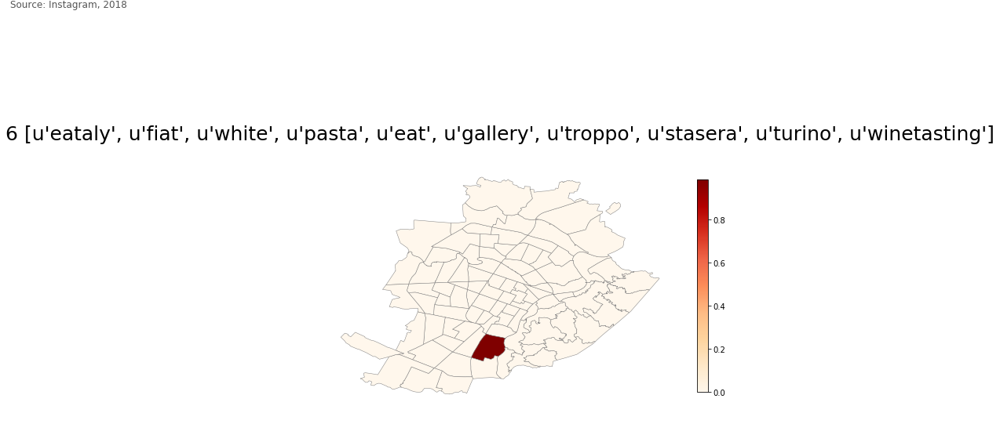

2019-03-25 14:07:35,921 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/6_[u'eataly',_u'fiat',_u'white',_u'pasta',_u'eat',_u'gallery',_u'troppo',_u'stasera',_u'turino',_u'winetasting']



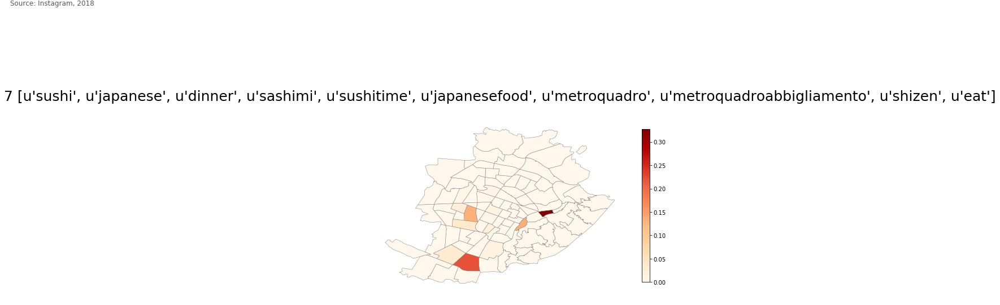

2019-03-25 14:07:38,601 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/7_[u'sushi',_u'japanese',_u'dinner',_u'sashimi',_u'sushitime',_u'japanesefood',_u'metroquadro',_u'metroquadroabbigliamento',_u'shizen',_u'eat']



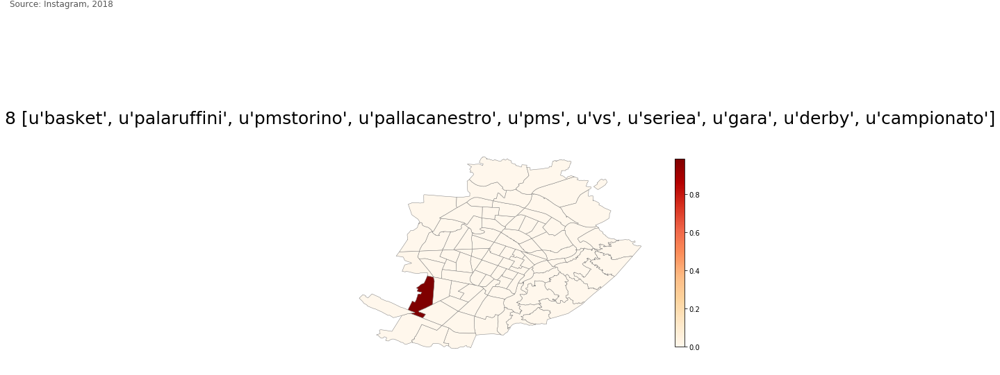

2019-03-25 14:07:41,231 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/8_[u'basket',_u'palaruffini',_u'pmstorino',_u'pallacanestro',_u'pms',_u'vs',_u'seriea',_u'gara',_u'derby',_u'campionato']



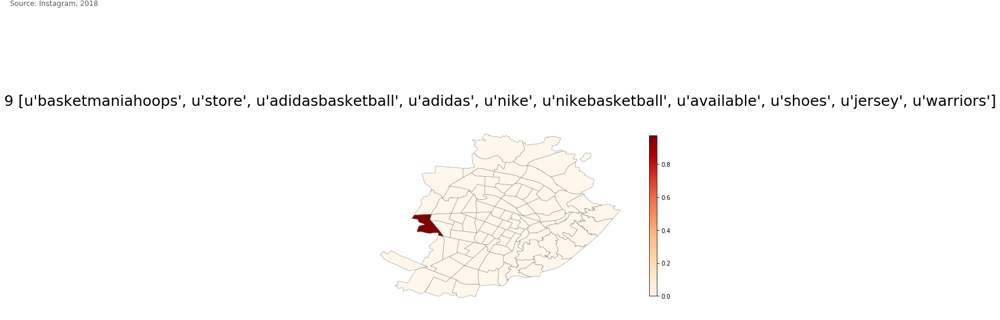

2019-03-25 14:07:43,871 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/9_[u'basketmaniahoops',_u'store',_u'adidasbasketball',_u'adidas',_u'nike',_u'nikebasketball',_u'available',_u'shoes',_u'jersey',_u'warriors']



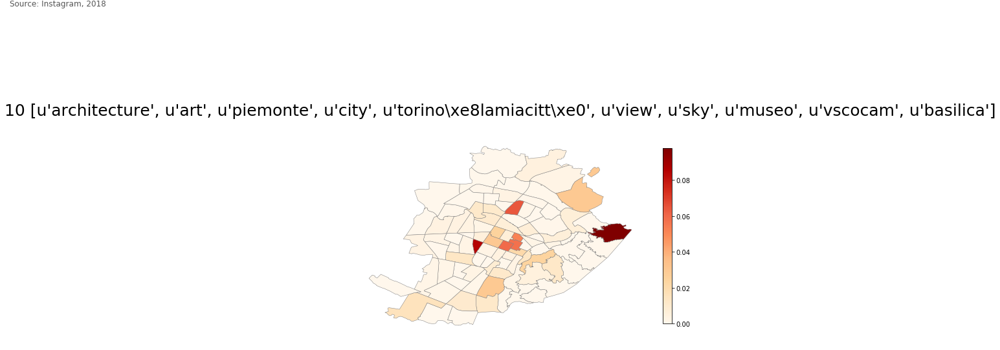

2019-03-25 14:07:46,327 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/10_[u'architecture',_u'art',_u'piemonte',_u'city',_u'torino\xe8lamiacitt\xe0',_u'view',_u'sky',_u'museo',_u'vscocam',_u'basilica']



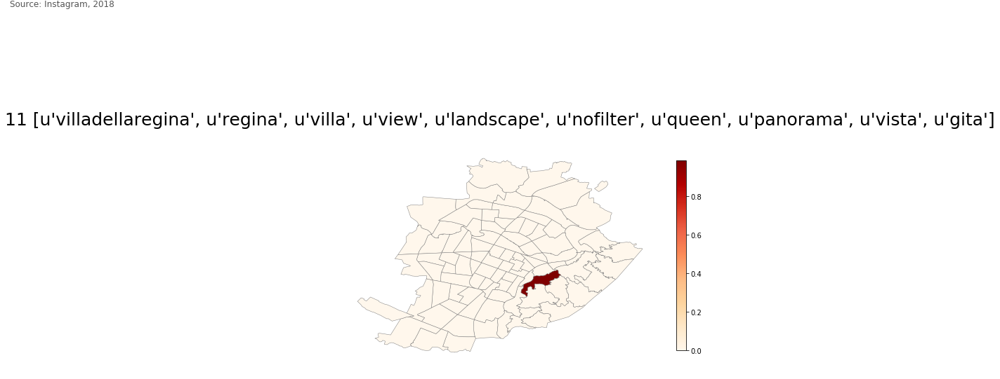

2019-03-25 14:07:48,778 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/11_[u'villadellaregina',_u'regina',_u'villa',_u'view',_u'landscape',_u'nofilter',_u'queen',_u'panorama',_u'vista',_u'gita']



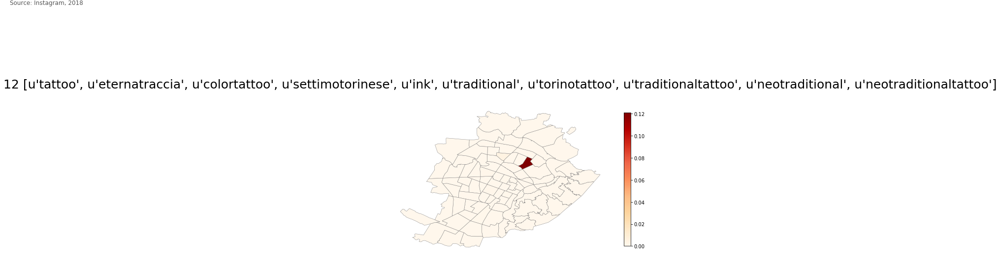

2019-03-25 14:07:51,300 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/12_[u'tattoo',_u'eternatraccia',_u'colortattoo',_u'settimotorinese',_u'ink',_u'traditional',_u'torinotattoo',_u'traditionaltattoo',_u'neotraditional',_u'neotraditionaltattoo']



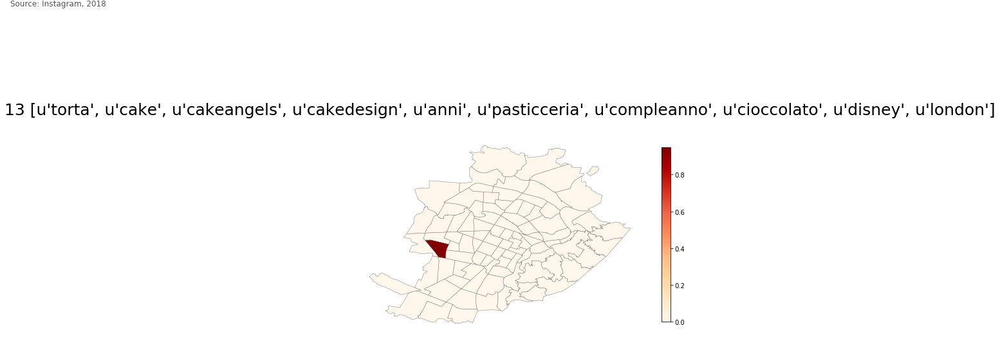

2019-03-25 14:07:53,820 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/13_[u'torta',_u'cake',_u'cakeangels',_u'cakedesign',_u'anni',_u'pasticceria',_u'compleanno',_u'cioccolato',_u'disney',_u'london']



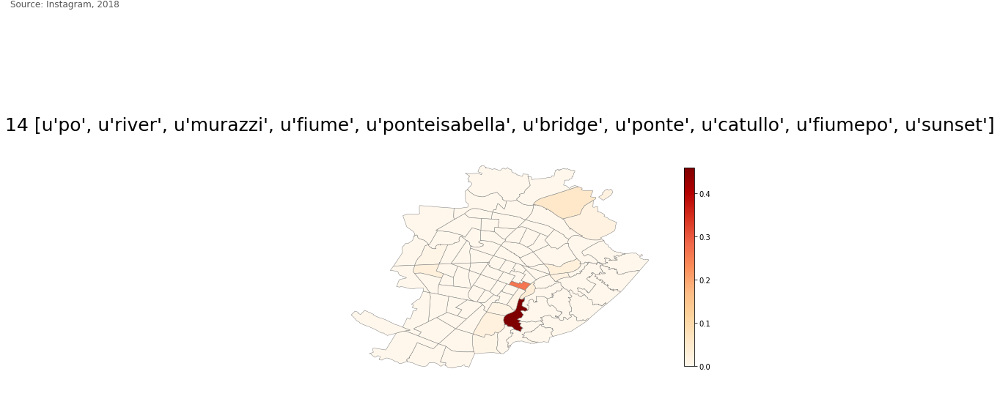

2019-03-25 14:07:56,531 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/14_[u'po',_u'river',_u'murazzi',_u'fiume',_u'ponteisabella',_u'bridge',_u'ponte',_u'catullo',_u'fiumepo',_u'sunset']



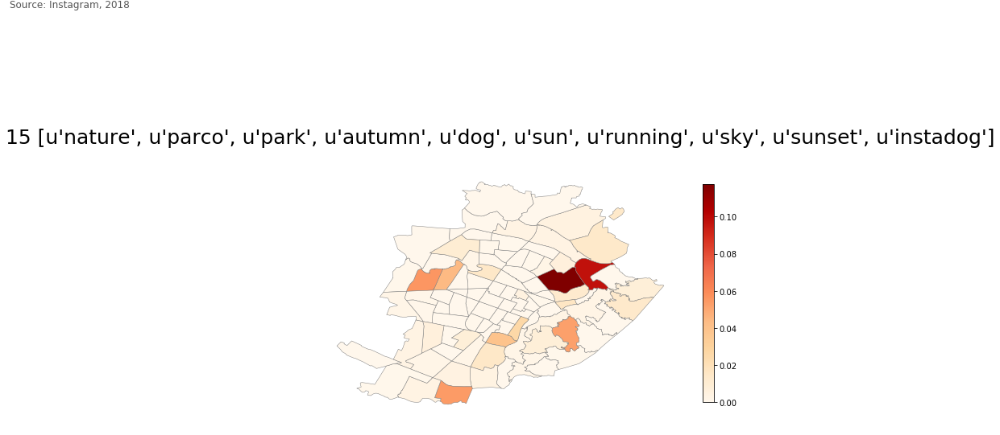

2019-03-25 14:07:58,953 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/15_[u'nature',_u'parco',_u'park',_u'autumn',_u'dog',_u'sun',_u'running',_u'sky',_u'sunset',_u'instadog']



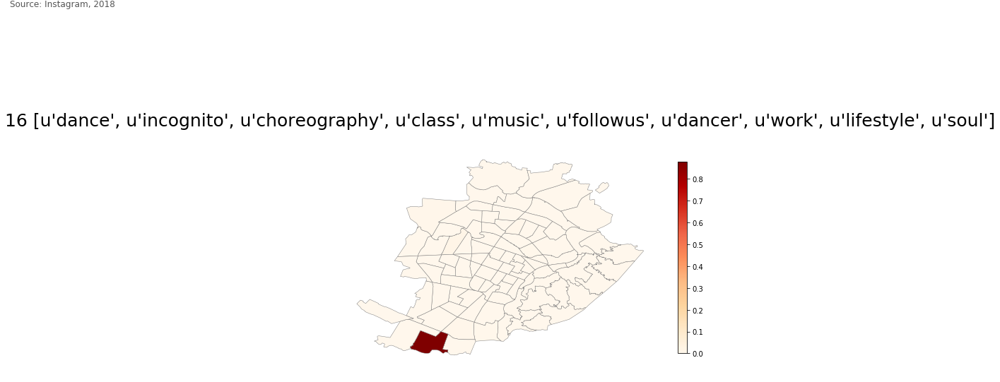

2019-03-25 14:08:01,401 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/16_[u'dance',_u'incognito',_u'choreography',_u'class',_u'music',_u'followus',_u'dancer',_u'work',_u'lifestyle',_u'soul']



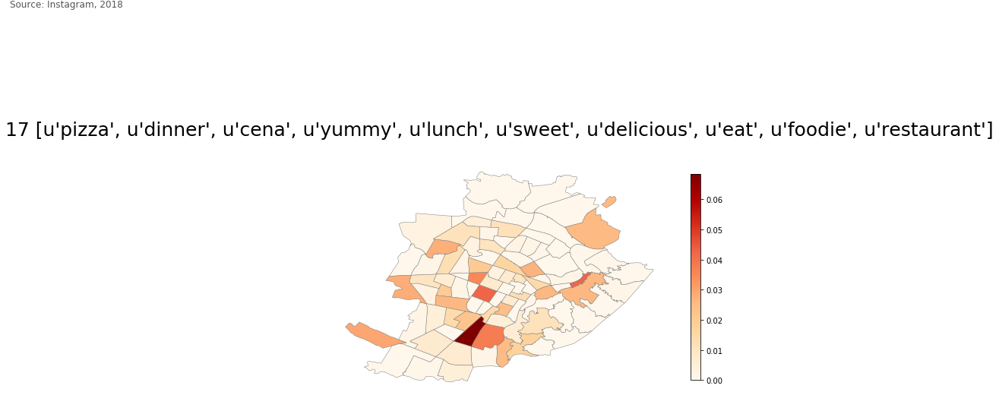

2019-03-25 14:08:03,869 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/17_[u'pizza',_u'dinner',_u'cena',_u'yummy',_u'lunch',_u'sweet',_u'delicious',_u'eat',_u'foodie',_u'restaurant']



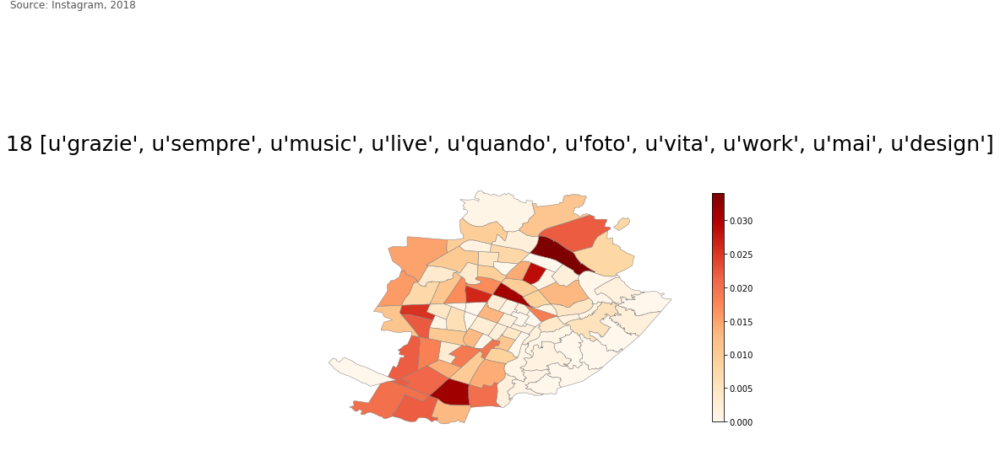

2019-03-25 14:08:06,301 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/18_[u'grazie',_u'sempre',_u'music',_u'live',_u'quando',_u'foto',_u'vita',_u'work',_u'mai',_u'design']



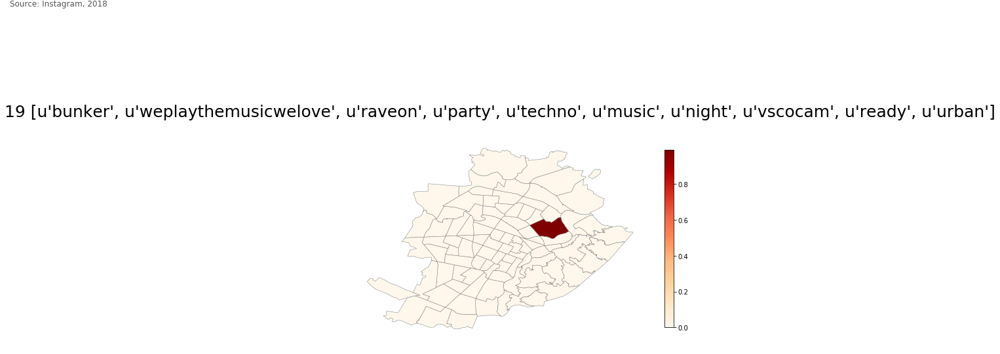

2019-03-25 14:08:08,758 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/19_[u'bunker',_u'weplaythemusicwelove',_u'raveon',_u'party',_u'techno',_u'music',_u'night',_u'vscocam',_u'ready',_u'urban']



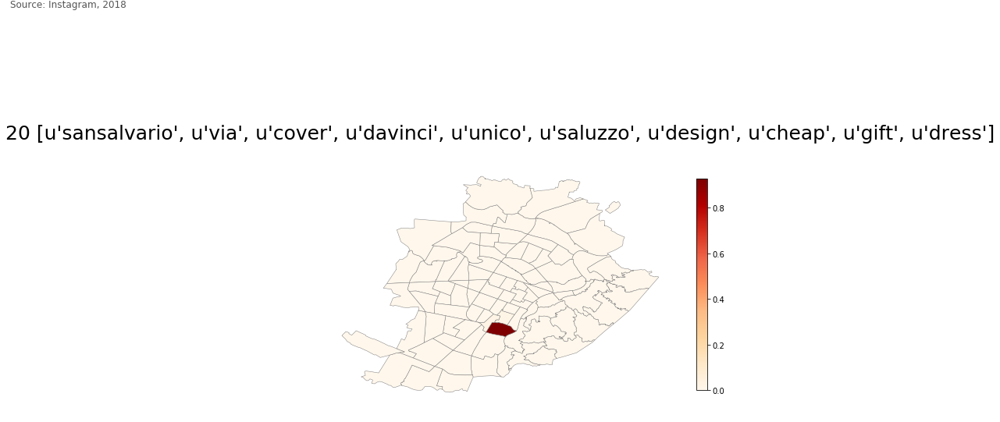

2019-03-25 14:08:11,186 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/20_[u'sansalvario',_u'via',_u'cover',_u'davinci',_u'unico',_u'saluzzo',_u'design',_u'cheap',_u'gift',_u'dress']



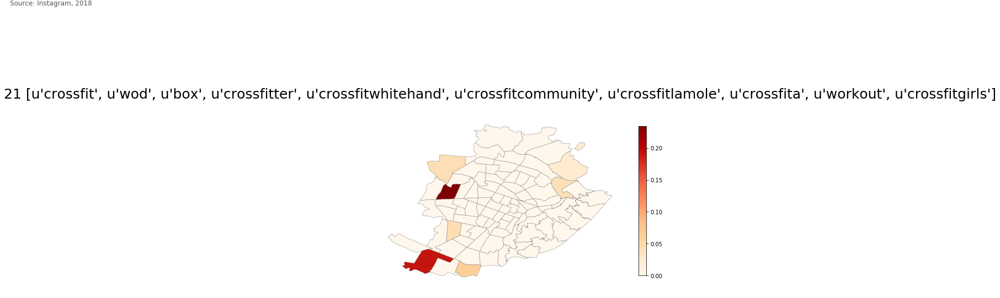

2019-03-25 14:08:13,652 : INFO : Failed to auto identify EPSG: 7


file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/21_[u'crossfit',_u'wod',_u'box',_u'crossfitter',_u'crossfitwhitehand',_u'crossfitcommunity',_u'crossfitlamole',_u'crossfita',_u'workout',_u'crossfitgirls']



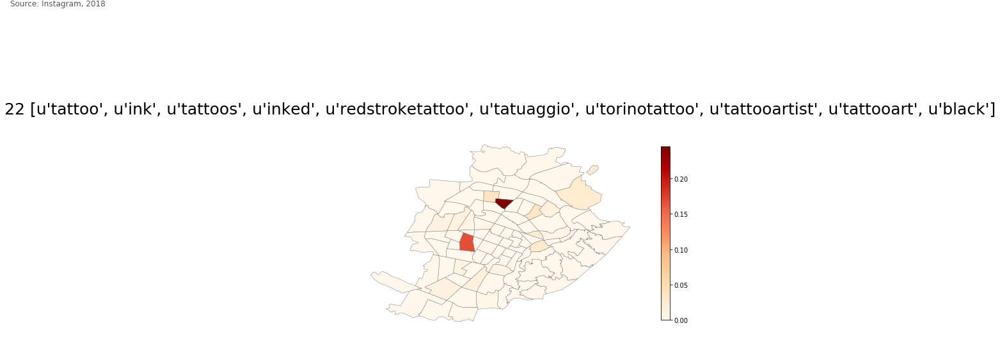

file saved Results/2019-03-20_23_5000_noMon_spl_#50/Heatmaps/22_[u'tattoo',_u'ink',_u'tattoos',_u'inked',_u'redstroketattoo',_u'tatuaggio',_u'torinotattoo',_u'tattooartist',_u'tattooart',_u'black']



In [149]:
reload(IL)
reload(IP)
#msg='Set of Heatmaps made on the 24/01, sampled from April 2013. First run to be made with 17 TV. with Monuments'
#foldername1='Heatmaps_2401_17_spl'
#foldername2='NTF_2401_17_spl'

#Geographical repartition of topics
for i in range(0,len(A.T)):
    Coordinates=list(df_classified.index)
    row=A.T[i]
    topic=str(i)
#    for j in (0,1,2):
#        topic+='_'+TermVectorsIndex[i][j][0]
    #IL.geo_topic(row,Coordinates,i,topic=topic,save=True,folder=path+'Heatmaps/')
#    IP.geo_hm_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=False,folder=path+'Heatmaps/',shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')
    IP.geo_hm_one(A.T[i],df_toNTF.index,'OrRd',TermVectors2[i],save=True,folder=path+'Heatmaps/',shapefile='SHP_files/zone_statistiche_geo/zone_statistiche_geo.shp')
    #IP.geo_plot_one(A.T[i],df_toNTF.index,'OrRd',string.join([t[0] for t in TermVectorsIndex[i][0:3]]),save=True,folder=path+'Heatmaps/',shapefile='zone_statistiche_geo/zone_statistiche_geo.shp')

0 [u'night', u'happy', u'day', u'summer', u'sun', u'sky', u'fun', u'piazza', u'relax', u'girl']



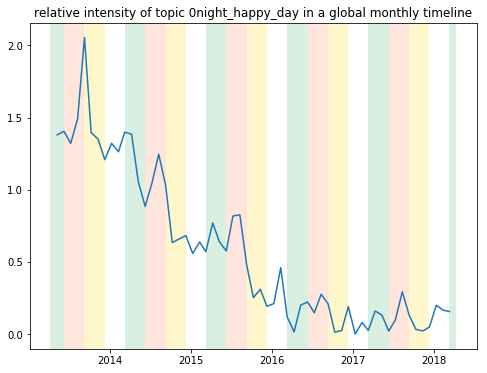

1 [u'gym', u'fitness', u'workout', u'palestra', u'training', u'motivation', u'bodybuilding', u'sport', u'fit', u'gymlife']



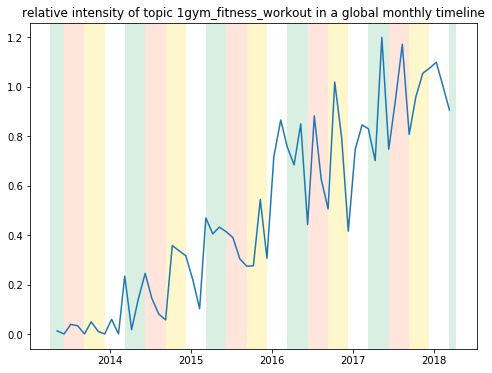

2 [u'fashion', u'summer', u'girl', u'happy', u'cute', u'fun', u'style', u'swag', u'selfie', u'amazing']



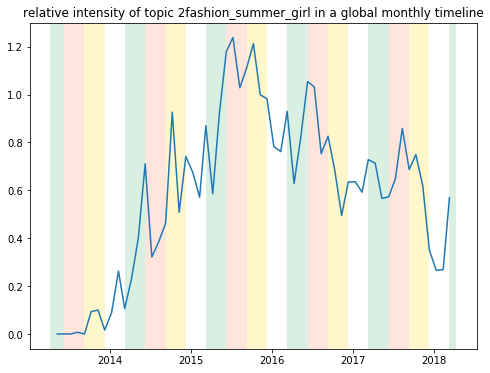

3 [u'barbershop', u'hair', u'haircut', u'barber', u'hairstyle', u'barberlife', u'barbering', u'barbersinctv', u'barbiere', u'style']



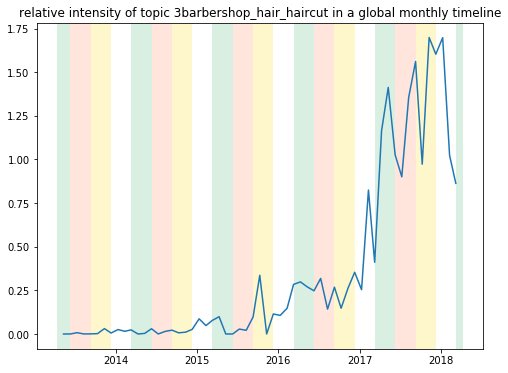

4 [u'collegno', u'giovioesilvestro', u'hair', u'rivoli', u'hairstyle', u'grugliasco', u'balayage', u'alpignano', u'pianezza', u'capelli']



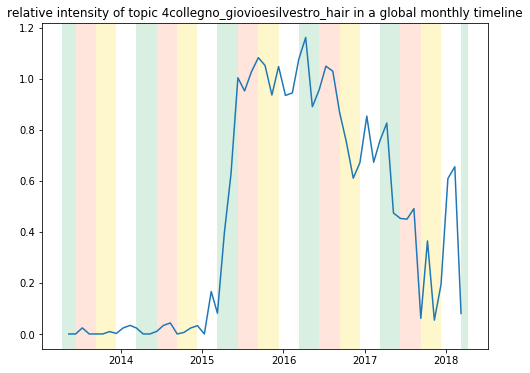

5 [u'artissima', u'contemporaryart', u'art', u'dancehall', u'studio', u'studiotorino', u'hotel', u'arte', u'nh', u'st']



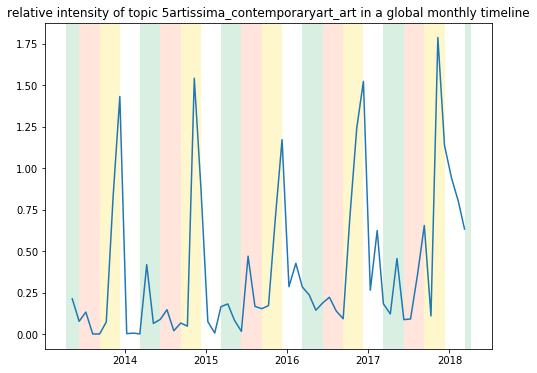

6 [u'eataly', u'fiat', u'white', u'pasta', u'eat', u'gallery', u'troppo', u'stasera', u'turino', u'winetasting']



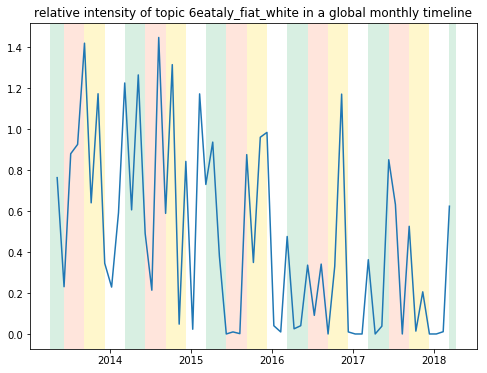

7 [u'sushi', u'japanese', u'dinner', u'sashimi', u'sushitime', u'japanesefood', u'metroquadro', u'metroquadroabbigliamento', u'shizen', u'eat']



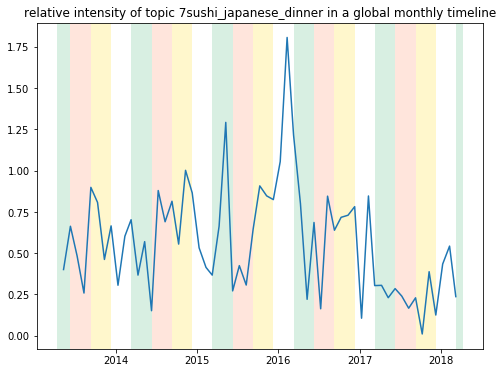

8 [u'basket', u'palaruffini', u'pmstorino', u'pallacanestro', u'pms', u'vs', u'seriea', u'gara', u'derby', u'campionato']



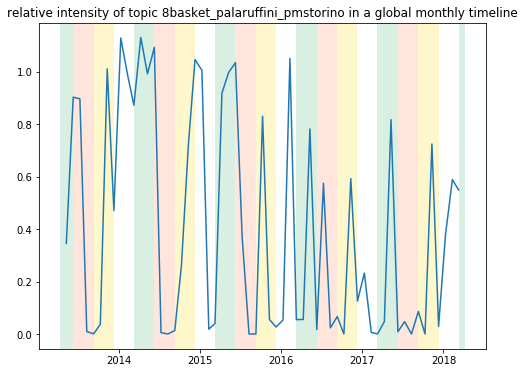

9 [u'basketmaniahoops', u'store', u'adidasbasketball', u'adidas', u'nike', u'nikebasketball', u'available', u'shoes', u'jersey', u'warriors']



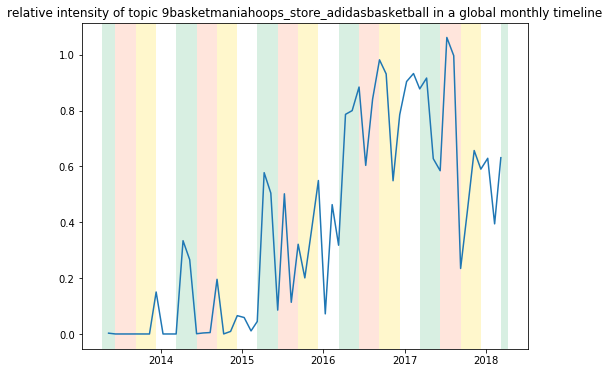

10 [u'architecture', u'art', u'piemonte', u'city', u'torino\xe8lamiacitt\xe0', u'view', u'sky', u'museo', u'vscocam', u'basilica']



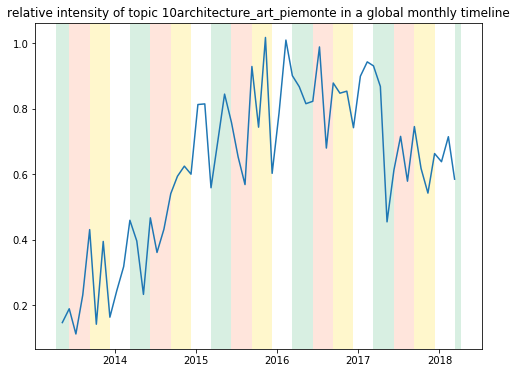

11 [u'villadellaregina', u'regina', u'villa', u'view', u'landscape', u'nofilter', u'queen', u'panorama', u'vista', u'gita']



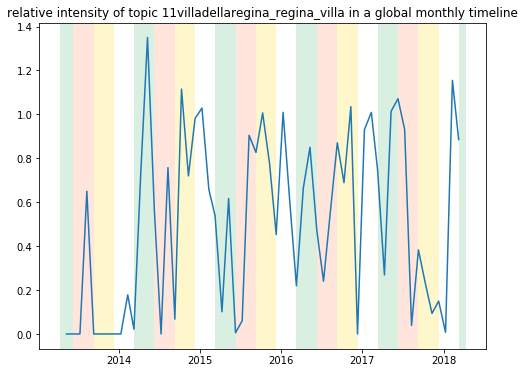

12 [u'tattoo', u'eternatraccia', u'colortattoo', u'settimotorinese', u'ink', u'traditional', u'torinotattoo', u'traditionaltattoo', u'neotraditional', u'neotraditionaltattoo']



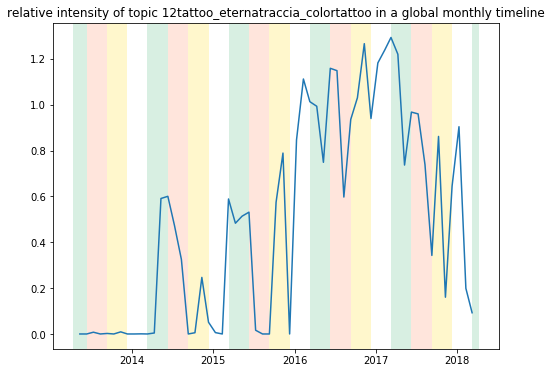

13 [u'torta', u'cake', u'cakeangels', u'cakedesign', u'anni', u'pasticceria', u'compleanno', u'cioccolato', u'disney', u'london']



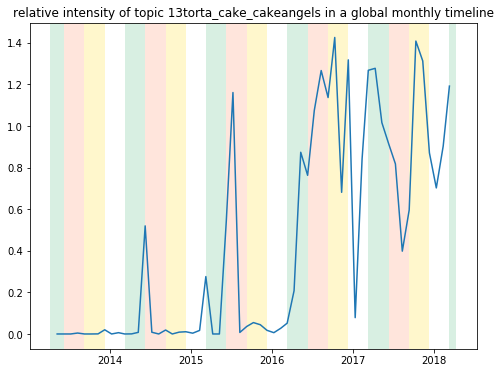

14 [u'po', u'river', u'murazzi', u'fiume', u'ponteisabella', u'bridge', u'ponte', u'catullo', u'fiumepo', u'sunset']



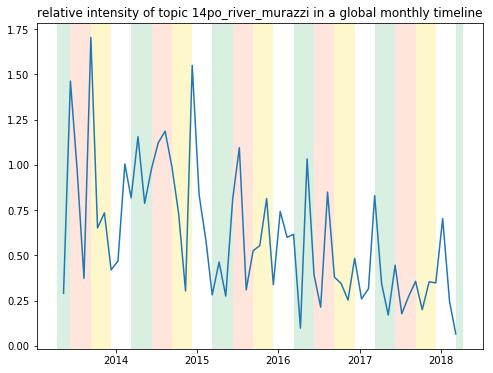

15 [u'nature', u'parco', u'park', u'autumn', u'dog', u'sun', u'running', u'sky', u'sunset', u'instadog']



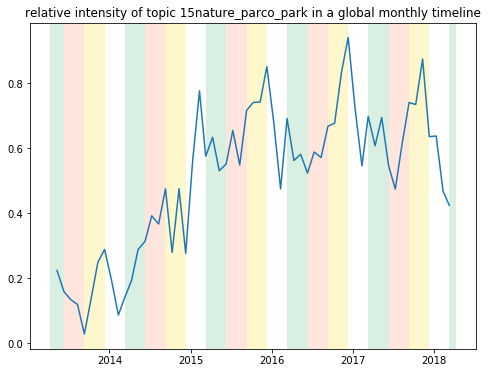

16 [u'dance', u'incognito', u'choreography', u'class', u'music', u'followus', u'dancer', u'work', u'lifestyle', u'soul']



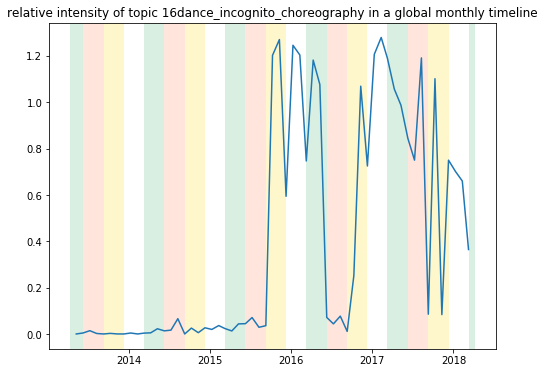

17 [u'pizza', u'dinner', u'cena', u'yummy', u'lunch', u'sweet', u'delicious', u'eat', u'foodie', u'restaurant']



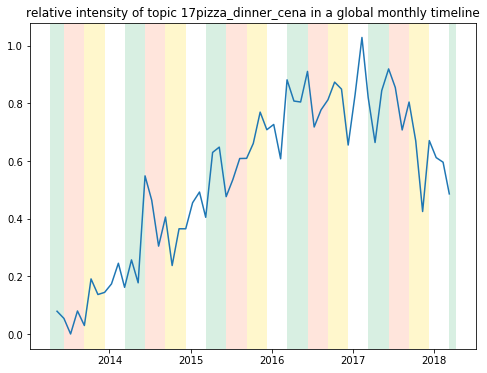

18 [u'grazie', u'sempre', u'music', u'live', u'quando', u'foto', u'vita', u'work', u'mai', u'design']



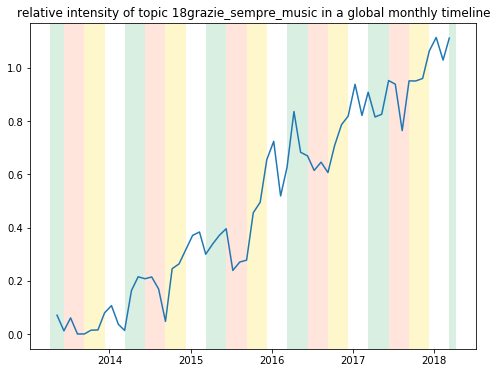

19 [u'bunker', u'weplaythemusicwelove', u'raveon', u'party', u'techno', u'music', u'night', u'vscocam', u'ready', u'urban']



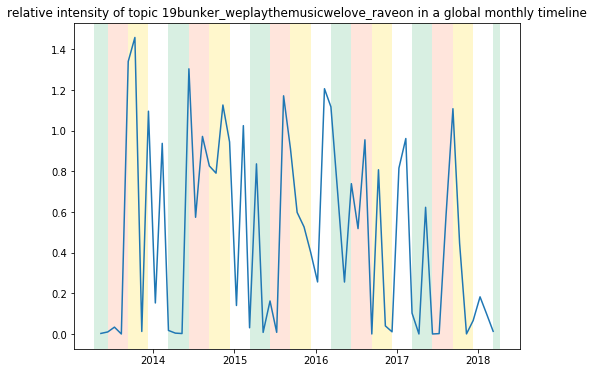

20 [u'sansalvario', u'via', u'cover', u'davinci', u'unico', u'saluzzo', u'design', u'cheap', u'gift', u'dress']



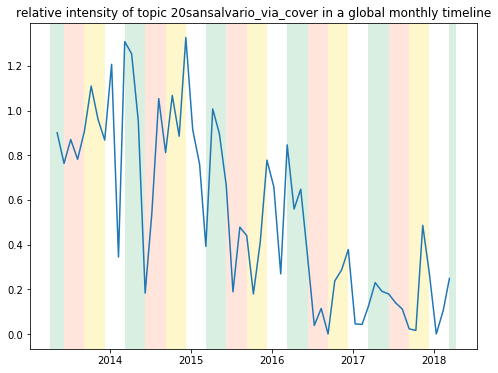

21 [u'crossfit', u'wod', u'box', u'crossfitter', u'crossfitwhitehand', u'crossfitcommunity', u'crossfitlamole', u'crossfita', u'workout', u'crossfitgirls']



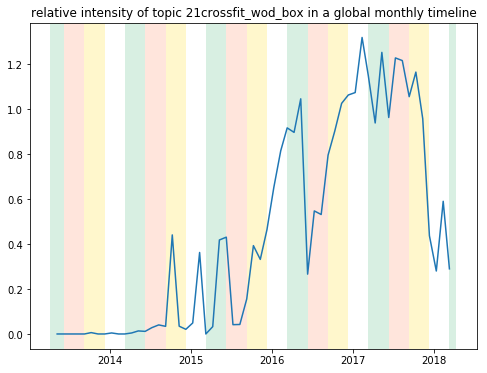

22 [u'tattoo', u'ink', u'tattoos', u'inked', u'redstroketattoo', u'tatuaggio', u'torinotattoo', u'tattooartist', u'tattooart', u'black']



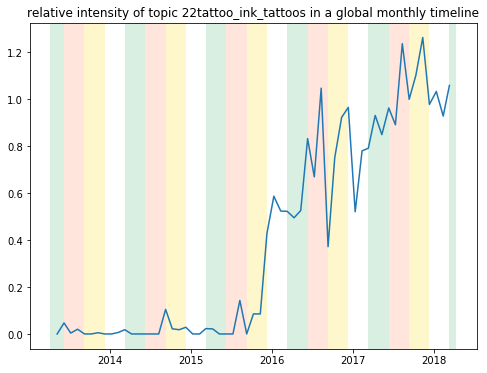

In [154]:
# Time Series    
clock=df_toNTF.columns.tolist()[list(df_toNTF.columns).index(start_spl):]
seasons=['white', 'mediumseagreen', 'coral', 'gold','white']
for index in range(0, len(C.T)):
    row=C.T[index]
    topic=str(index)
    print TermVectors2[index]
    for i in (0,1,2):
        topic+=TermVectorsIndex[index][i][0]+'_'
    topic=topic.strip('_')
    plt.figure()
    #plt.plot(flags[flags.index(start):][0:len(row)], row)
    plt.plot(clock[len(clock)-len(row):-1],row[:-1])
    for i,m in enumerate(clock[:-1]):
        m=m.month
        season=seasons[m/3]
        
        #season=seasons[m.month/3]
        plt.axvspan(clock[i],clock[i+1], facecolor=season, alpha=0.2)
    plt.title('relative intensity of topic '+topic+' in a global monthly timeline')
    if True:
        plt.savefig(path+'t_series/plot_topic_'+topic+'.pdf')
    plt.show()

In [155]:
path

'Results/2019-03-20_23_5000_noMon_spl_#50/'

# Neighbourhood relative dynamics

In [509]:
path='Results/2019-01-31_8_5000_noMon_festival_word2vec/'
#path='Results/2019-02-06_8_5000/'
#path='Results/2019-02-06_8_5000_spl/'

In [510]:
#path='todo/torinojazzfestival/'
#path='todo/art/streetart/'
#path='Results/2019-01-30_17_5000_noMon/'
A=pickle.load(open(path+'pickle/A.pkl','r')) #bins/topic
C=pickle.load(open(path+'pickle/C.pkl','r')) #time/topic
B=pickle.load(open(path+'pickle/B.pkl','r')) #words/topic
Grid=pickle.load(open(path+'pickle/Grid.pkl','r'))
TermVectors2=open(path+'TermVectors.txt', 'r').readlines()[::-1]
#tjf=7
#TJF_vec=A.T[tjf]
#Norm=np.sqrt(sum([t*t for t in TJF_vec]))
#TJF_vec=[t/Norm for t in TJF_vec]

In [78]:
import shapely
from shapely.geometry import Point

In [79]:
Grid=df_toNTF.index.tolist()
#clock=[s.time() for s in df_classified.columns.tolist()[0:-1]]
SHP_ngh=geopandas.read_file('zone_statistiche_geo/zone_statistiche_geo.shp')
#SHP_ngh=geopandas.read_file('microzone_censuarie_geo/microzone_censuarie_geo.shp')
SHP_ngh.crs={'init':'epsg:3003'}
C_bins=[[j for j,g in enumerate(Grid) if Point((g[1],g[0])).within(SHP_ngh.to_crs(epsg=4326).geometry.iloc[i])] for i in SHP_ngh.index]
SHP_ngh['bins']=C_bins

2019-03-12 17:00:36,216 : INFO : Failed to auto identify EPSG: 7


In [403]:
clock=df_toNTF.columns.tolist()

In [80]:
#Build a dict of all bins belonging to a neighbourhood.
dict_ngh_bins={}
for i in SHP_ngh.index:
    dict_ngh_bins[SHP_ngh.ZONASTAT.iloc[i]]=SHP_ngh.bins.iloc[i]
pickle.dump(dict_ngh_bins, open('dict_ngh_bins.pkl', 'w'))

In [404]:
dict_ngh_bins = pickle.load(open('dict_ngh_bins.pkl', 'r'))

In [81]:
# Build a topic/time matrix for each neighbourhood.
D=[]

#For all zone statistiche
for k in dict_ngh_bins.keys():
    #C shape is n_topics, n_months
    d=np.zeros(C.shape)
    #For all bins in the zone
    for b in dict_ngh_bins[k]:
        #Add to d the topic vector of this bin multiplied by the topic/time matrix
        d+=(A[b]*C)
    #d has shape months x topics
    d_norm=np.array(d)
    for i,row in enumerate(d):
        N=np.sqrt(sum([e**2 for e in row]))
        if N:
            row=[e/N for e in row]
            d_norm[i]=row
        else:
            d_norm[i]=[0 for e in row]
    D.append(d_norm.T)

In [82]:
name='globalNTF_relatdyn/'
os.mkdir(name)

/home/eartiges/.local/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


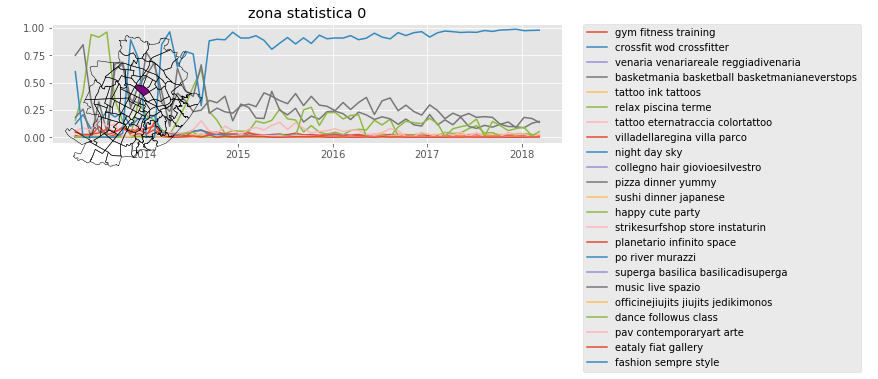

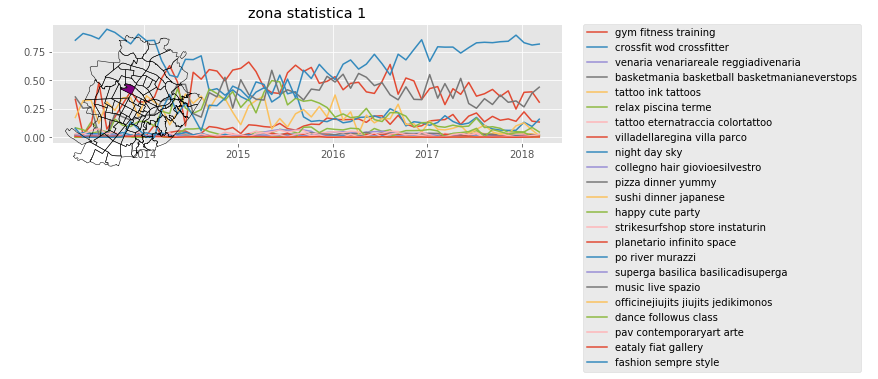

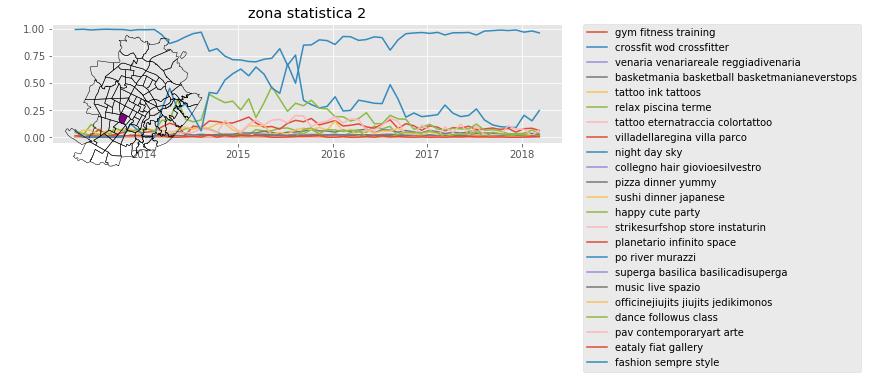

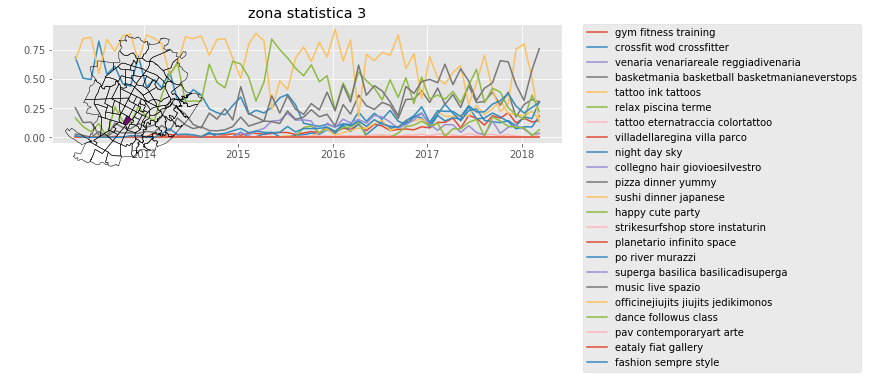

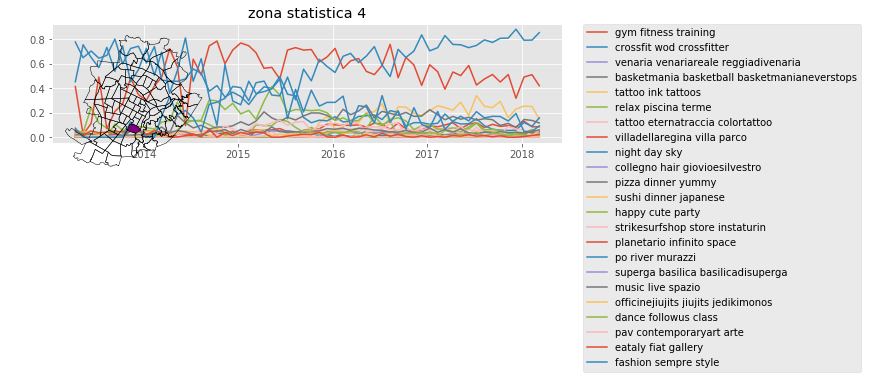

...

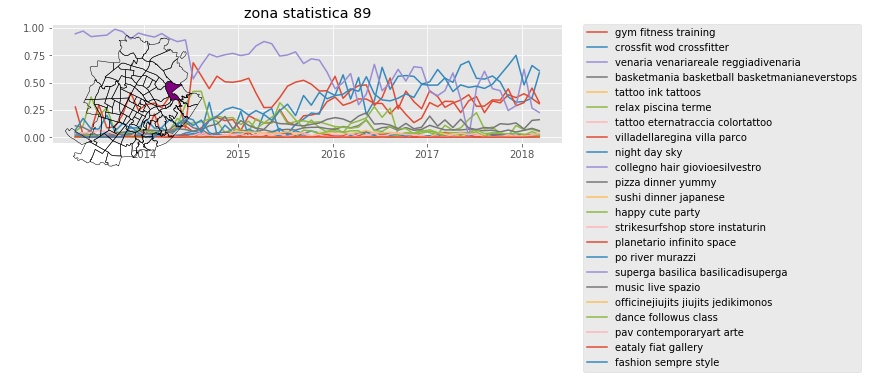

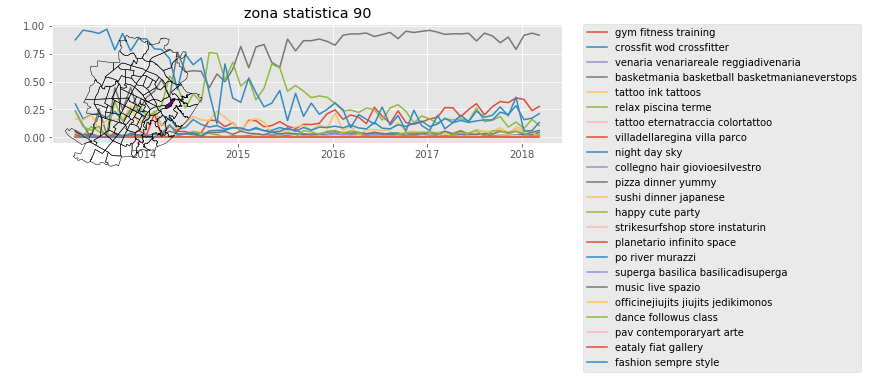

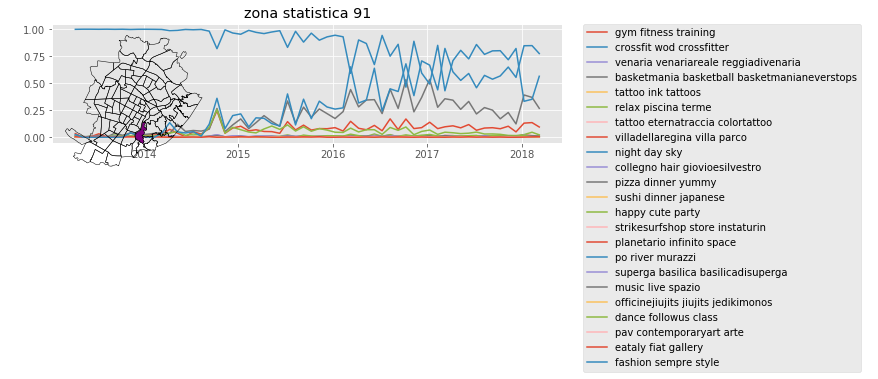

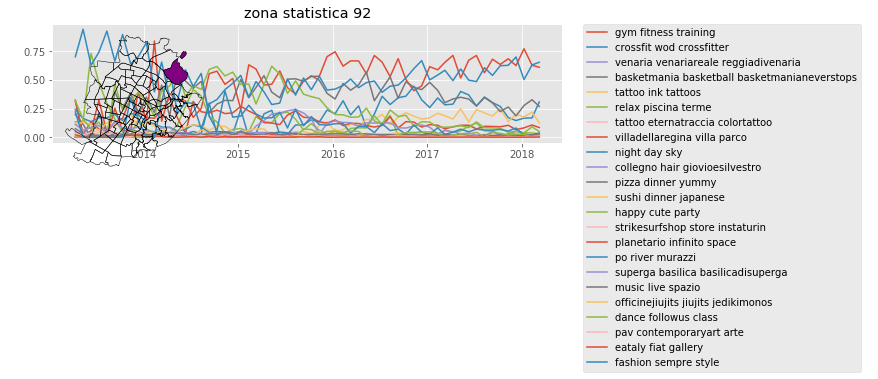

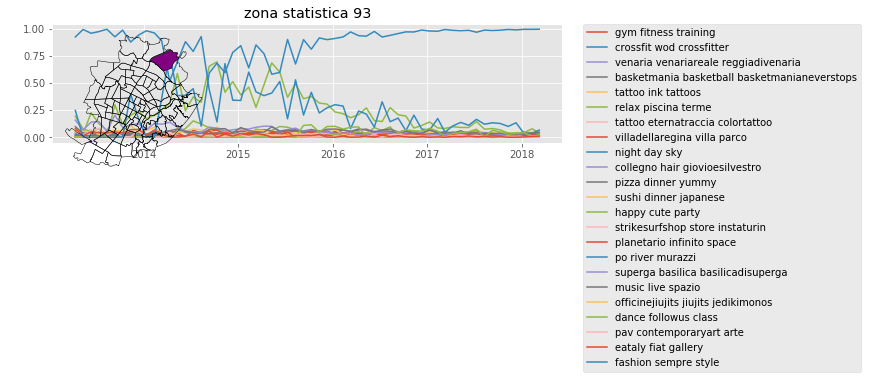

In [84]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams["figure.figsize"] = 12,4
plt.style.use('ggplot')

for zona,d in enumerate(D):
    f, (ax1,lax) = plt.subplots(ncols=2, gridspec_kw={"width_ratios":[4,1]})
    ax1.set_title('zona statistica {}'.format(zona))
    axins = inset_axes(ax1, width="30%", height=2, loc=2)
    axins.axis('off')
    for tp,plot in enumerate(d):
        label=' '.join([t.strip("[u'],") for t in TermVectors2[tp].split(' ')[1:4]])
        #ax1.plot(clock[len(clock)-len(plot):-1], plot[:-1],label=label)
        ax1.plot(clock[:-1], plot,label=label)
    
    h,l = ax1.get_legend_handles_labels()
    lax.legend(h,l, borderaxespad=0)
    lax.axis("off")
    SHP_ngh.geometry.plot(color=(0,0,0,0),edgecolor='black',ax=axins)
    SHP_ngh.geometry[SHP_ngh.ZONASTAT==dict_ngh_bins.keys()[zona]].plot(color='purple',edgecolor='black',ax=axins)
    plt.tight_layout()
    plt.savefig(name+'zona statistica {}'.format(zona)+'.pdf')
    plt.show()
    plt.close()

In [164]:
reload(IP)
neighbourhoods, relevant_bins_by_ngh=IP.relevant_bins_to_ngbh(TJF_vec, Grid)

2019-03-01 17:42:04,047 : INFO : Failed to auto identify EPSG: 7


otsu threshold 0.13555429212443396


In [34]:
def neighbourhood_relative_dynamics(row, C):
    # multiply each neighbourhood topic vector by the topic dynamic matrix
    C_Q=C*row
    C_Q=C_Q.T
    
    #Normalize to represent the relative importance of each topic
    C_Q_Norm=[]
    for i in range(C_Q.T.shape[0]):
        C_row=C_Q.T[i]
        N=np.sqrt(sum([r**2 for r in C_row]))
        if not N==0:
            C_row=[r/N for r in C_row]
        C_Q_Norm.append(C_row)
    return np.array(C_Q_Norm).T

# JSON file writing

In [18]:
import json

data = {'topics':{}, 'bbox':{}, 'grid':{}, 'activity':{},
}

topics={}
TermVectors=open('todo/torinojazzfestival/TermVectors.txt', 'r').readlines()
TermVectors=[t[3:-1].split(' ')[0:3] for t in TermVectors]
for i,t in enumerate(TermVectors):
    topics[str(i)]=[w[2:-2] for w in t]
data['topics'] = topics

lats=sorted(set([s[0] for s in Grid]))
lons=sorted(set([s[1] for s in Grid]))
data['bbox']=[min(lons),min(lats),max(lons),max(lats)]

def grid_to_index(Grid):
    lats=sorted(set([s[0] for s in Grid]))
    lons=sorted(set([s[1] for s in Grid]))
    size=[len(lats), len(lons)]
    grid2=[(lats.index(s[0]),lons.index(s[1])) for s in Grid]
    return size, [s[0]*size[0]+s[1] for s in grid2]

size,indices = grid_to_index(Grid)
data['grid']=size

In [19]:
#convert coordinates to index: nrows*ncol+ncol
coords_indices= [d[1] for d in relevant_bins_by_ngh.values()]

In [20]:
timestamps=[]
for i in range(len(C_Q1_Norm.T)):
    s=IL.abs_to_yearmonth(i,[i for i in range(2010,2018)])
    s=s.timestamp()
    timestamps.append(s)

In [58]:
coords_bins=grid_to_index(Grid)[1]

activity={}

all_neighbourhoods=[neighbourhood_relative_dynamics(A[ic], C) for ic in range(len(coords_bins))]

for i,t in enumerate(timestamps):
    #For each timestep
    for ic, index in enumerate(coords_bins):
        #For each coordinates, take the corresponding 
        topics_intensities=all_neighbourhoods[ic].T[i]
        #topics_int = [1,2,3,4,5] intensities at time t
        local_dict={}
        for to,tp in enumerate(topics_intensities):
            local_dict[str(to)]=tp
        try:
            activity[str(int(t))][str(index)]=local_dict
        except KeyError:
            activity[str(int(t))]={str(index):local_dict}
data['activity']=activity

In [68]:
json.dump(data,open('JSON_Torino_seed_festival.json', 'wb'))

In [35]:
data=json.load(open('try1.json', 'rb'))

# Seeds

In [ ]:
#seed = 'nonegativity' #
#seed = 'nigga'
#seed = 'troia'
#seed = 'puttana'
#seed = 'recycling' #ecojewelry
#seed = 'read'
#seed = 'books'
#seed = 'bookstagram'
#seed = 'alluvione'
#seed = 'exploretorino'
#seed = 'selfies'
#seed = 'exhibit'
#seed = 'cultura'
#seed = 'graffiti'
#seed = 'selfie' #
#seed = 'nigga'
#seed = 'troia'
#seed = 'puttana'
#seed = 'recycling' #ecojewelry
#seed = 'read'
#seed = 'books'
#seed = 'bookstagram'
#seed = 'alluvione'
#seed = 'exploretorino'
#seed = 'selfies'
#seed = 'exhibit'
#seed = 'cultura'
#seed = 'graffiti'
#seed = 'torinofilmfestival'
#seed = 'torinocomics'
#seed = 'ecology'
#seed = 'dogood'
#seed = 'ecodesign'
#seed = 'exhibition'
#seed = 'sicurezza' #yields a term vector about breast cancer
#seed = 'seno'
#seed = 'parco'
#seed =  'artigianato'
#seed = 'yoga'
#seed = 'birraartiginale' 5493
#seed = 'handmadejewellery'
#seed = 'handcraft' 588
#seed = 'birds'
#seed = 'gay'
#seed = 'queer'
#seed = 'lesbian'
#seed = 'happy'
#seed = 'studentlife'
#seed = 'lucidartista'
#seed = 'pedestrian'
#seed = 'hidden'
#seed = 'wine'
#seed = 'architect'
#seed = 'greenarchitecture'
#seed= 'rushclub'
#seed='fluido'
#seed='chaletclub'

# Matlab debug cell

In [ ]:
if False:
    counts = vectorizer_s.fit_transform(list_reviews_all)
    vectorizer_new = StemmedCountVectorizer(max_df=0.95, max_features=n_features, analyzer="word", stop_words=all_stopwords,vocabulary=vectorizer_s.vocabulary_) 

    eng=matlab.engine.start_matlab()
    folders=[int(s.split('_')[-1].strip('.mat')[-2:]) for s in os.listdir('CC_matlab/')]
    deb,ed=min(folders),max(folders)

    list_idn, list_CCs=eng.CC_matlab(deb,ed,name_matlab,3,3,nargout=2)
    list_mean_cc=[np.mean(d) for d in list_CCs[1:]]
    list_std_cc=[np.std(d) for d in list_CCs[1:]]

    plt.figure()
    plt.errorbar([i+1 for i,j in enumerate(list_mean_cc)],list_mean_cc,yerr=list_std_cc)
    plt.show()
    plt.close()